# 베이스라인 코드 실험

In [5]:
# 운영체제에 따라 폰트 경로 설정
import platform
import os
import json
import glob
from tqdm import tqdm  # 진행 상황 표시
from collections import defaultdict, Counter
import pandas as pd # 분석을 위해 pandas 사용
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import random
from matplotlib import font_manager, rc
from sklearn.model_selection import train_test_split
import torch
import numpy as np
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

if platform.system() == 'Windows':
    # Windows: Malgun Gothic 설정
    font_name = font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
    rc('font', family = font_name)
elif platform.system() == 'Darwin': # Mac OS
    # Mac OS: Apple Gothic 설정
    rc('font', family = 'AppleGothic')
else:
    # Linux 또는 기타 OS: 널리 사용되는 Nanum Gothic을 가정하거나, 기본 폰트 사용
    try:
        font_name = font_manager.FontProperties(fname = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf').get_name()
        rc('font', family = font_name)
    except:
        rc('font', family = 'DejaVu Sans')

# 마이너스 부호 깨짐 방지
plt.rcParams['axes.unicode_minus'] = False

In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cpu


In [7]:
base_dir = "data/raw/"

train_img_dir = os.path.join(base_dir, "train_images")
test_img_dir = os.path.join(base_dir, "test_images")
train_ann_dir = os.path.join(base_dir, "train_annotations")

# train_annotations 폴더 및 모든 하위 폴더에서 .json 파일 검색
json_files = glob.glob(os.path.join(train_ann_dir, "**", "*.json"), recursive = True)
print(f"총 {len(json_files)}개의 JSON 어노테이션 파일")

# train_images 폴더의 모든 이미지 파일 목록 수집
all_train_img_files = {f for f in os.listdir(train_img_dir) if not f.startswith('.')}
print(f"총 {len(all_train_img_files)}개의 학습 이미지 파일")
print(f"총 {len(os.listdir(test_img_dir))}개의 테스트 이미지 파일")

총 4526개의 JSON 어노테이션 파일
총 1489개의 학습 이미지 파일
총 843개의 테스트 이미지 파일


In [8]:
# JSON 파일들을 읽어 하나의 데이터로 통합
master_data = defaultdict(lambda: {
    'image_path': '',
    'width': 0,
    'height': 0,
    'annotations': []
})

# 클래스 이름(알약 이름)을 숫자로 매핑할 딕셔너리를 초기화
# YOLO 같은 모델은 클래스를 이름이 아닌 0, 1, 2... 같은 숫자로 구분하기 때문에 이 매핑이 필수
class_to_id = {}
# 새로 발견된 클래스에 부여할 숫자 ID를 0부터 시작하도록 초기화
current_id = 0
# JSON 파일을 처리(파싱)하다가 오류가 발생한 경우 카운트할 변수
processing_errors = 0

# glob.glob()로 찾은 모든 JSON 파일(4526개)의 경로 리스트를 순회
for json_path in json_files:
    # 'with open ...' 구문을 사용해 현재 순서의 JSON 파일을 연다
    with open(json_path, 'r', encoding = 'utf-8') as f:
        data = json.load(f)

    # 이미지 정보 추출
    img_info = data['images'][0]
    # 해당 이미지의 파일명 추출
    img_filename = img_info['file_name']

    # 이미지 경로/크기 저장(이미지 당 1회)
    if not master_data[img_filename]['image_path']:
        image_path = os.path.join(train_img_dir, img_filename)
        master_data[img_filename]['image_path'] = image_path
        master_data[img_filename]['width'] = img_info['width']
        master_data[img_filename]['height'] = img_info['height']

    # 클래스 이름 매핑 준비
    # 이 JSON 파일이 정의하는 카테고리(알약) 정보를 맵으로 만든다
    category_map = {cat['id']: cat['name'] for cat in data['categories']}

    # 어노테이션(BBox) 처리
    for ann in data['annotations']:
        bbox = ann['bbox'] # [x, y, w, h]

        # category_id를 사용해 실제 클래스 이름을 찾는다
        ann_cat_id = ann['category_id']

        if ann_cat_id not in category_map:
            processing_errors += 1
            continue # category_map에 없으면 이 알약(ann)은 건너뛰고 다음 알약으로

        class_name = category_map[ann_cat_id]

        # 클래스 ID 부여
        if class_name not in class_to_id:
            class_to_id[class_name] = current_id
            current_id += 1

        class_id = class_to_id[class_name]

        # 최종 어노테이션 추가
        master_data[img_filename]['annotations'].append({
            'class_id': class_id,
            'class_name': class_name, # 이름도 저장해두면 분석에 유용할 것 같다
            'bbox': bbox
        })

print(f"총 {len(master_data)}개의 이미지 데이터 처리")
print(f"총 {len(class_to_id)}개의 고유 클래스(알약 종류) 발견")

# 결과 저장
# 이게 진짜 학습 데이터이다 4526개의 JSON을 1489개의 이미지별 묶음으로 만들었다 이 안에 이미지의 모든 정답이 들어있다
with open(os.path.join(base_dir, "train_master_annotations.json"), "w", encoding = 'utf-8') as f:
    json.dump(master_data, f, ensure_ascii = False, indent = 4)

# 이건 이름(키)와 숫자(value)를 연결해주는 맵이다
with open(os.path.join(base_dir, "class_to_id.json"), "w", encoding = 'utf-8') as f:
    json.dump(class_to_id, f, ensure_ascii = False, indent = 4)

print("train_master_annotations.json 파일과 class_to_id.json 파일 저장")

총 1489개의 이미지 데이터 처리
총 73개의 고유 클래스(알약 종류) 발견
train_master_annotations.json 파일과 class_to_id.json 파일 저장


# EDA

## 파일 다운 및 개수 확인

In [9]:
# 경로 설정
base_dir = "data/raw/"

train_img_dir = os.path.join(base_dir, "train_images")
test_img_dir = os.path.join(base_dir, "test_images")
train_ann_dir = os.path.join(base_dir, "train_annotations")

# train_annotations 폴더 및 모든 하위 폴더에서 .json 파일 검색
json_files = glob.glob(os.path.join(train_ann_dir, "**", "*.json"), recursive = True)
print(f"총 {len(json_files)}개의 JSON 어노테이션 파일")

# train_images 폴더의 모든 이미지 파일 목록 수집
all_train_img_files = {f for f in os.listdir(train_img_dir) if not f.startswith('.')}
print(f"총 {len(all_train_img_files)}개의 학습 이미지 파일")
print(f"총 {len(os.listdir(test_img_dir))}개의 테스트 이미지 파일")

총 4526개의 JSON 어노테이션 파일
총 1489개의 학습 이미지 파일
총 843개의 테스트 이미지 파일


- 4526개의 어노테이션이 있다 학습 이미지 파일은 1489개이다 이미지 하나에 여러 알약이 있다는 뜻이겠다(이미지를 대략적으로 직접 봐도 대부분 3 - 4개씩 있었다)
- 테스트 이미지는 원래 어노테이션이 없다

### 속성 확인

In [12]:
# 속성 확인
all_metadata_records = []
processing_errors = 0

# JSON 파일에서 추출할 메타데이터 속성 목록 (images 섹션의 모든 키를 동적으로 추출)
# 첫 번째 JSON 파일에서 모든 가능한 키를 추출하여 컬럼을 동적으로 생성
if json_files:
    with open(json_files[0], 'r', encoding='utf-8') as f:
        sample_data = json.load(f)
        if sample_data and 'images' in sample_data and sample_data['images']:
            # file_name, width, height 등 약 50여개의 모든 속성 키를 추출
            all_possible_keys = list(sample_data['images'][0].keys())
        else:
            all_possible_keys = []
else:
    all_possible_keys = []

# 이미지당 캡처/약물 메타데이터 수집
for json_path in tqdm(json_files, desc="Collecting all metadata"):
    try:
        with open(json_path, 'r', encoding='utf-8') as f:
            data = json.load(f)

        if not data.get('images'):
            processing_errors += 1
            continue

        img_info = data['images'][0]
        record = {}

        # 1. Image 및 Drug Metadata (약 50개 항목)
        for key in all_possible_keys:
            record[key] = img_info.get(key)

        # 2. Annotation Metadata (BBox 정보)
        # 한 JSON 파일에는 여러 개의 BBox가 있을 수 있으므로, 각 BBox마다 레코드를 생성
        if not data.get('annotations'):
            # 어노테이션이 없는 경우도 레코드에 포함 (필요하다면)
            record['bbox'] = None
            record['category_id'] = None
            all_metadata_records.append(record.copy())
            continue

        for ann in data['annotations']:
            # BBox 정보 추가 (리스트 [x, y, w, h]로 저장)
            record['bbox'] = ann['bbox']
            # BBox가 연결된 클래스 ID (dl_idx/dl_mapping_code와는 다름, categories 섹션의 id)
            record['annotation_category_id'] = ann['category_id']

            # 딕셔너리를 복사하여 리스트에 추가 (매 BBox마다 하나의 행)
            all_metadata_records.append(record.copy())

    except Exception as e:
        processing_errors += 1
        # print(f"Error processing {json_path}: {e}")
        continue

# DataFrame으로 변환
metadata_all_pills_df = pd.DataFrame(all_metadata_records)

print("\n" + "=" * 50)
print(f"총 {len(metadata_all_pills_df)}개의 알약/BBox 레코드 수집 완료")
print(f"처리 오류 발생 JSON 파일 수: {processing_errors}개")
print(f"전체 속성(컬럼) 개수: {len(metadata_all_pills_df.columns)}개")

# 데이터프레임의 첫 5행과 모든 컬럼을 출력
print("\n첫 5개 알약 레코드의 모든 메타데이터:")
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
print(metadata_all_pills_df.head().to_string())

# 사용 후 옵션 복원
pd.reset_option('display.max_columns')
pd.reset_option('display.width')


총 4526개의 알약/BBox 레코드 수집 완료
처리 오류 발생 JSON 파일 수: 0개
전체 속성(컬럼) 개수: 52개

첫 5개 알약 레코드의 모든 메타데이터:
                                              file_name  width  height                                               imgfile    drug_N drug_S back_color drug_dir light_color  camera_la  camera_lo  size dl_idx dl_mapping_code         dl_name          dl_name_en                                                      img_key           dl_material                                          dl_material_en dl_custom_shape dl_company dl_company_en di_company_mf di_company_mf_en   item_seq di_item_permit_date   di_class_no di_etc_otc_code          di_edi_code                                        chart drug_shape  thick  leng_long  leng_short print_front print_back color_class1 color_class2 line_front line_back img_regist_ts form_code_name mark_code_front_anal mark_code_back_anal mark_code_front_img mark_code_back_img mark_code_front mark_code_back change_date  id                  bbox  annotation_categor

### 파일 검증

In [11]:
# JSON에서 참조하는 이미지 파일명 수집
annotated_img_files = set()

for jf in json_files:
    try:
        with open(jf, 'r', encoding = 'utf-8') as f:
            data = json.load(f)
        if data.get("images"):
            img_filename = data["images"][0].get("file_name")
            if img_filename:
                annotated_img_files.add(img_filename)
    except Exception as e:
        print(f"Error reading {jf}: {e}")
        continue

# 이미지 폴더에는 있는데 JSON이 참조하지 않는 이미지
imgs_without_annotations = all_train_img_files - annotated_img_files
print(f"어노테이션이 없는 이미지 수: {len(imgs_without_annotations)} 개")

# JSON은 참조하고 있는데 이미지 폴더에 실물 파일이 없는 경우
annotations_without_imgs = annotated_img_files - all_train_img_files
print(f"이미지가 없는 어노테이션 수: {len(annotations_without_imgs)} 개")

어노테이션이 없는 이미지 수: 0 개
이미지가 없는 어노테이션 수: 0 개


- 1489개의 모든 이미지 파일이 최소 하나 이상의 JSON 파일에 의해 참조되고 있다 또 4526개의 JSON 파일이 참조하는 모든 이미지 파일이 train_images 폴더 내에 실물로 존재한다
- 파일 검증 부분은 특별하게 결점은 없는 것 같다

## 데이터 통합

In [13]:
# JSON 파일들을 읽어 하나의 데이터로 통합
master_data = defaultdict(lambda: {
    'image_path': '',
    'width': 0,
    'height': 0,
    'annotations': []
})
class_to_id = {}
current_id = 0
processing_errors = 0

for json_path in json_files:

    with open(json_path, 'r', encoding = 'utf-8') as f:
        data = json.load(f)

    # 이미지 정보 추출
    img_info = data['images'][0]
    img_filename = img_info['file_name']

    # 이미지 경로/크기 저장(이미지 당 1회)
    if not master_data[img_filename]['image_path']:
        image_path = os.path.join(train_img_dir, img_filename)
        master_data[img_filename]['image_path'] = image_path
        master_data[img_filename]['width'] = img_info['width']
        master_data[img_filename]['height'] = img_info['height']

    # 클래스 이름 매핑 준비
    # 이 JSON 파일이 정의하는 카테고리(알약) 정보를 맵으로 만든다
    category_map = {cat['id']: cat['name'] for cat in data['categories']}

    # 어노테이션(BBox) 처리
    for ann in data['annotations']:
        bbox = ann['bbox'] # [x, y, w, h]

        # category_id를 사용해 실제 클래스 이름을 찾는다
        ann_cat_id = ann['category_id']

        if ann_cat_id not in category_map:
            processing_errors += 1
            continue # category_map에 없으면 이 알약(ann)은 건너뛰고 다음 알약으로

        class_name = category_map[ann_cat_id]

        # 클래스 ID 부여
        if class_name not in class_to_id:
            class_to_id[class_name] = current_id
            current_id += 1

        class_id = class_to_id[class_name]

        # 최종 어노테이션 추가
        master_data[img_filename]['annotations'].append({
            'class_id': class_id,
            'class_name': class_name, # 이름도 저장해두면 분석에 유용할 것 같다
            'bbox': bbox
        })

print(f"총 {len(master_data)}개의 이미지 데이터 처리")
print(f"총 {len(class_to_id)}개의 고유 클래스(알약 종류) 발견")

# 결과 저장
# 이게 진짜 학습 데이터이다 4526개의 JSON을 1489개의 이미지별 묶음으로 만들었다 이 안에 이미지의 모든 정답이 들어있다
with open(os.path.join(base_dir, "train_master_annotations.json"), "w", encoding = 'utf-8') as f:
    json.dump(master_data, f, ensure_ascii = False, indent = 4)

# 이건 이름(키)와 숫자(value)를 연결해주는 맵이다
with open(os.path.join(base_dir, "class_to_id.json"), "w", encoding = 'utf-8') as f:
    json.dump(class_to_id, f, ensure_ascii = False, indent = 4)

print("train_master_annotations.json 파일과 class_to_id.json 파일 저장")

총 1489개의 이미지 데이터 처리
총 73개의 고유 클래스(알약 종류) 발견
train_master_annotations.json 파일과 class_to_id.json 파일 저장


- 1489개의 이미지에 73개의 클래스가 있다
- 사용하기 쉽게 train_master_annotations.json과 class_to_id.json을 만들어 저장했다

### 실제 train_image 확인

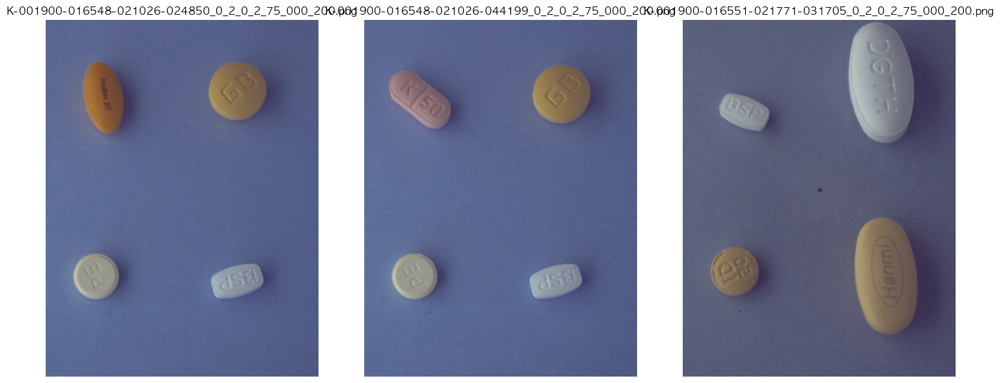

In [14]:
# 시각화할 이미지 파일 경로 목록 생성
# master_data의 키(파일 이름)들을 리스트로 가져온다
all_filenames = list(master_data.keys())

# 전체 파일 목록 중 3개를 랜덤으로 선택
if len(all_filenames) >= 3:
    sample_filenames = random.sample(all_filenames, 3)
else:
    # 파일이 3개 미만일 경우 전체 파일을 사용
    sample_filenames = all_filenames

# image_path를 재구성
sample_image_paths = [
    os.path.join(train_img_dir, filename) for filename in sample_filenames
]

# 이미지 로드 및 플로팅
plt.figure(figsize = (15, 6))
plot_index = 1

for i, img_path in enumerate(sample_image_paths):
    # OpenCV를 사용하여 이미지 로드
    img = cv2.imread(img_path)

    # 파일 로드 실패 검사 (안정성 확보)
    if img is None:
        print(f"파일 로드 실패 - '{img_path}'")
        continue

    # BGR -> RGB 변환
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # 서브플롯에 표시
    plt.subplot(1, 3, plot_index)
    plt.imshow(img_rgb)

    # 파일 이름에서 경로와 확장자 제거하여 제목으로 사용
    title = os.path.basename(img_path)
    plt.title(title, fontsize = 12)
    plt.axis('off')

    plot_index += 1

plt.tight_layout()
plt.savefig('random_sample_images.png')
plt.show()

약의 이미지를 실제로 시각화 해보았다

### 실제 BBox 확인

시각화 샘플 선정 완료: ['K-002483-013395-023223-025438_0_2_0_2_75_000_200.png', 'K-003483-022347-025469-029667_0_2_0_2_75_000_200.png']
'bbox_visualization_samples.png' 파일로 시각화 결과 저장


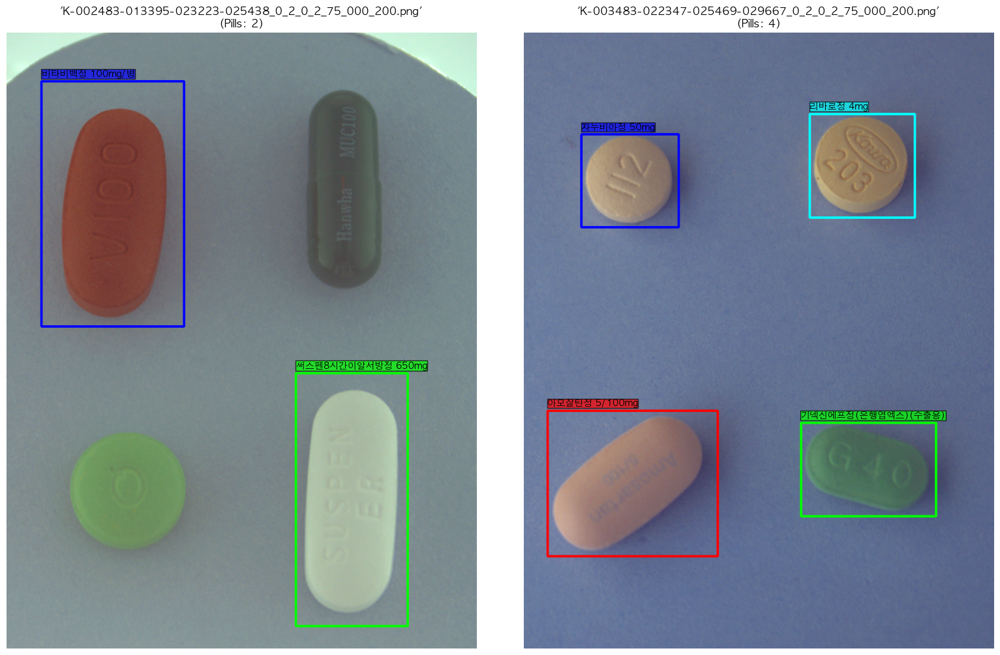

In [15]:
import os
import cv2
import random
import matplotlib.pyplot as plt
from collections import defaultdict

# class_to_id의 key(이름)와 value(id)를 뒤집은 id_to_class 맵
id_to_class = {v: k for k, v in class_to_id.items()}

# 시각화할 샘플 이미지 선정
images_by_count = defaultdict(list)
for img_filename, data in master_data.items():
    pill_count = len(data['annotations'])
    if pill_count > 0:  # 어노테이션이 1개 이상 있는 이미지만
        images_by_count[pill_count].append(img_filename)

# 알약 2개짜리, 4개짜리 이미지 파일명을 랜덤으로 하나씩 선택
try:
    sample_2_pill = random.choice(images_by_count[2])
    sample_4_pill = random.choice(images_by_count[4])
    sample_filenames = [sample_2_pill, sample_4_pill]
    print(f"시각화 샘플 선정 완료: {sample_filenames}")
except Exception as e:
    print(f"샘플 선정 오류: {e}. (2개 또는 4개짜리 이미지가 없을 수 있음)")
    sample_filenames = random.sample(list(master_data.keys()), 2)  # 대안: 그냥 2개 랜덤

# BBox 시각화 및 저장
plt.figure(figsize=(16, 10))

# BBox 색상 (BGR)
COLORS = [
    (255, 0, 0),    # Blue
    (0, 255, 0),    # Green
    (0, 0, 255),    # Red
    (255, 255, 0)   # Yellow
]

for i, img_filename in enumerate(sample_filenames):
    img_path = os.path.join(train_img_dir, img_filename)

    # 이미지 로드 (BGR)
    image = cv2.imread(img_path)
    if image is None:
        print(f"오류: '{img_path}' 파일을 로드할 수 없음")
        continue

    annotations = master_data[img_filename]['annotations']

    # OpenCV에서 BGR로 박스 그리기
    for j, ann in enumerate(annotations):
        x, y, w, h = map(int, ann['bbox'])
        class_id = ann['class_id']
        class_name = id_to_class.get(class_id, "Unknown")

        color = COLORS[j % len(COLORS)]  # BGR
        cv2.rectangle(image, (x, y), (x + w, y + h), color, thickness=3)

        # 텍스트는 matplotlib에서 RGB 색상으로 표시
        ann['class_name'] = class_name
        ann['color'] = (color[2]/255, color[1]/255, color[0]/255)  # RGB 변환

    # subplot에 표시
    plt.subplot(1, 2, i + 1)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)
    plt.title(f"'{img_filename}'\n(Pills: {len(annotations)})", fontsize=12)
    plt.axis('off')

    # 텍스트 올리기
    for ann in annotations:
        x, y, w, h = map(int, ann['bbox'])
        plt.text(x, y - 10, ann['class_name'],
                 color='black',
                 fontsize=10,
                 bbox=dict(facecolor=ann['color'], alpha=0.7, pad=0.1))

plt.tight_layout()
output_filename = 'bbox_visualization_samples.png'
plt.savefig(output_filename)
print(f"'{output_filename}' 파일로 시각화 결과 저장")
plt.show()

BBox를 실제로 시각화를 해보았다

## 클래스 분석

### 클래스 분포 확인

총 4526개의 알약(= 바운딩 박스)
(전체 73개 클래스)
                  class_name  count
0         기넥신에프정(은행엽엑스)(수출용)    514
1                일양하이트린정 2mg    240
2                 보령부스파정 5mg    180
3                뮤테란캡슐 100mg    172
4                가바토파정 100mg    143
5              동아가바펜틴정 800mg    139
6               아토젯정 10/40mg    113
7                   리바로정 4mg    111
8                  리피토정 20mg    109
9                 크레스토정 20mg    108
10              로수젯정10/5밀리그램    108
11         무코스타정(레바미피드)(비매품)     99
12                플라빅스정 75mg     97
13              트윈스타정 40/5mg     94
14         제미메트서방정 50/1000mg     88
15            자누메트정 50/850mg     88
16              트라젠타정(리나글립틴)     87
17                자누비아정 50mg     85
18     자누메트엑스알서방정 100/1000mg     85
19                 카나브정 60mg     84
20         트라젠타듀오정 2.5/850mg     81
21             엑스포지정 5/160mg     80
22              세비카정 10/40mg     79
23             아모잘탄정 5/100mg     76
24                 노바스크정 5mg     66
25           큐시드정 31.5mg/PTP 

/var/folders/zh/p90w_k_x3y70qvq9273mm0pc0000gn/T/ipykernel_2310/3064637583.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


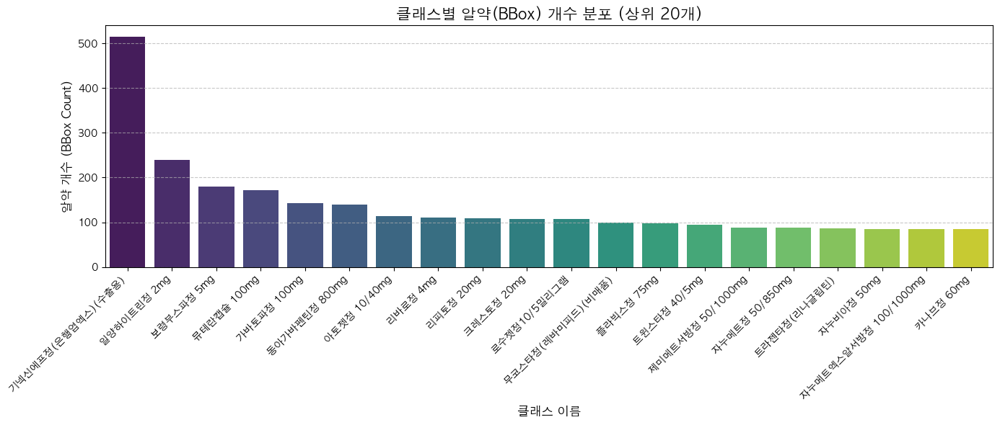

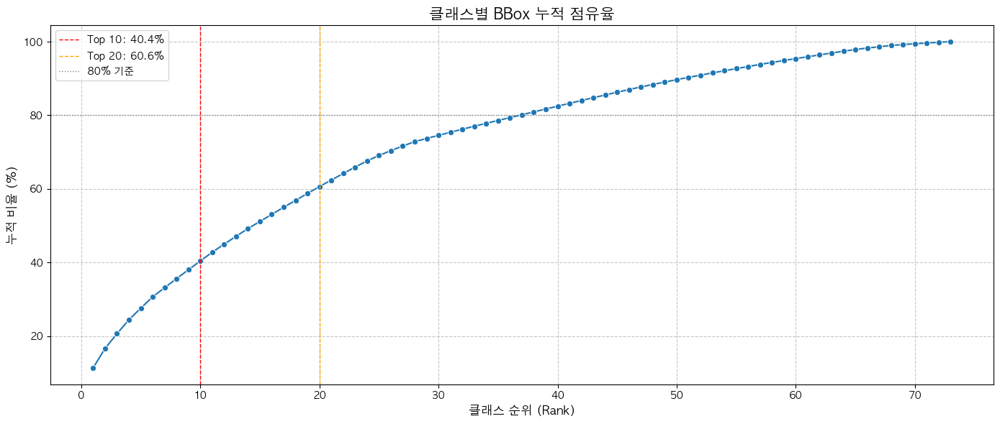

In [16]:
# master_data의 모든 'class_name'을 수집할 리스트
all_class_names = []
# 1489개 이미지를 순회하며, 각 이미지의 모든 BBox('annotations')에서 'class_name'을 추출해 리스트에 추가
for img_data in master_data.values():
    for ann in img_data['annotations']:
        all_class_names.append(ann['class_name'])

# 총 BBox 개수(4526개) 출력
print(f"총 {len(all_class_names)}개의 알약(= 바운딩 박스)")

# Counter를 사용해 'class_name'별 빈도수 계산
class_counts = Counter(all_class_names)

# (클래스명, 개수)를 DataFrame으로 변환
class_df = pd.DataFrame(class_counts.items(), columns = ['class_name', 'count'])
# 'count' (개수) 기준으로 내림차순 정렬
class_df = class_df.sort_values(by = 'count', ascending = False).reset_index(drop = True)

# 총 고유 클래스 개수(73개) 출력
print(f"(전체 {len(class_df)}개 클래스)")

# 전체 DataFrame (73개 클래스) 출력
print(class_df.to_string())

# 클래스 시각화
# 상위 20개 클래스만 시각화
TOP_N = 20

plt.figure(figsize = (14, 6))
# Seaborn 막대 그래프(barplot) 생성
sns.barplot(
    x = 'class_name',
    y = 'count',
    data = class_df.head(TOP_N), # 상위 20개 데이터만 사용
    palette = 'viridis'
)
plt.title(f'클래스별 알약(BBox) 개수 분포 (상위 {TOP_N}개)', fontsize = 15)
plt.xlabel('클래스 이름', fontsize = 12)
plt.ylabel('알약 개수 (BBox Count)', fontsize = 12)
plt.xticks(rotation = 45, ha = 'right', fontsize = 10) # X축 레이블 45도 회전
plt.grid(axis = 'y', linestyle = '--', alpha = 0.7)
plt.tight_layout()
plt.savefig('class_distribution_bar_plot_korean.png') # 그래프 파일로 저장
plt.show() # 그래프 출력


# 누적 분포 그래프 (Cumulative Distribution Plot)
# 전체 BBox 개수 합계 (4526)
total_bbox_count = class_df['count'].sum()
# 누적 개수 계산
class_df['cumulative_count'] = class_df['count'].cumsum()
# 누적 비율(%) 계산
class_df['cumulative_ratio'] = class_df['cumulative_count'] / total_bbox_count * 100

plt.figure(figsize = (14, 6))
# 누적 비율을 선 그래프(lineplot)로 표시
sns.lineplot(
    x = class_df.index + 1, # x축은 순위 (1~73)
    y = 'cumulative_ratio',
    data = class_df,
    marker = 'o'
)

# 상위 10위/20위 지점의 누적 비율 계산
top_10_ratio = class_df.iloc[min(9, len(class_df) - 1)]['cumulative_ratio']
top_20_ratio = class_df.iloc[min(19, len(class_df) - 1)]['cumulative_ratio']

# 그래프에 Top 10, Top 20, 80% 기준선(axvline, axhline) 추가
plt.axvline(x = 10, color = 'r', linestyle = '--', linewidth = 1, label = f'Top 10: {top_10_ratio:.1f}%')
plt.axvline(x = 20, color = 'orange', linestyle = '--', linewidth = 1, label = f'Top 20: {top_20_ratio:.1f}%')
plt.axhline(y = 80, color = 'gray', linestyle = ':', linewidth = 1, label = '80% 기준')

plt.title('클래스별 BBox 누적 점유율', fontsize = 15)
plt.xlabel('클래스 순위 (Rank)', fontsize = 12)
plt.ylabel('누적 비율 (%)', fontsize = 12)
plt.grid(linestyle = '--', alpha = 0.7)
plt.legend() # 범례 표시
plt.tight_layout()
plt.savefig('class_cumulative_distribution_plot_korean.png') # 그래프 파일로 저장
plt.show() # 그래프 출력

- 클래스 불균형이 심각한 것 같다
- 최다 클래스: '기넥신에프정(은행엽엑스)(수출용)' (514개, 전체의 11.4%)
- 최소 클래스: '브린텔릭스정 20mg' (7개, 전체의 0.15%)
- 상위 10개 클래스만 해도 40%는 넘는다
- 분할을 할 때 희귀한 알약들을 그나마 최대한 학습과 테스트에 나눠질 수 있도록 분할을 하는게 좋을 것 같다 stratified split (클래스 비율 유지)를 고려해본다
- 데이터 증강을 고려해본다(이전 미션 때 데이터가 이거보다 더 적은 미션을 한적이 있었는데 오히려 과한 증강이 해가된적은 있었다)
- 클래스 가중치를 조절해주는 방법들을 고려해본다
    - Oversampling or Undersampling or WeightedRandomSampler
    - 소수 클래스(예를 들면 50개 이하)는 강하게 증강
    - 클래스 그룹화(극도로 적은 클래스(예: 10개 미만)는 초반에는 묶어서 학습 후, 후반에 세분화)
    - 손실 함수에서 소수 클래스에 더 큰 가중치를 부여
        - Focal Loss
        - Class Weightd Loss
    - 앙상블 기법 (Ensemble Methods)
    - Two stage 학습
    - 이외에도 여러 기법을 고려해본다
    - 모델에 따라서 적용할 수 있는 방법이 달라질 수도 있을 것 같다

### 클래스별 고유값 확인

In [17]:
# 분석 대상 메타데이터 속성
TARGET_PROPERTIES = ['drug_shape', 'color_class1', 'print_front', 'print_back', 'dl_company_en']

# 클래스별 속성값 저장을 위한 딕셔너리
# Key: 클래스 이름 (dl_name), Value: {속성: [값1, 값2, ...]}
class_metadata_agg = defaultdict(lambda: {prop: [] for prop in TARGET_PROPERTIES})

for json_path in tqdm(json_files, desc = "Processing JSON metadata"):
    try:
        with open(json_path, 'r', encoding = 'utf-8') as f:
            data = json.load(f)
        # 'images' 섹션의 메타데이터 추출
        if not data['images']:
            continue

        img_info = data['images'][0]

        # 클래스 이름 추출 (dl_name이 실제 알약 이름)
        class_name = img_info.get('dl_name')
        if not class_name:
            continue

        # 각 속성값 추출 및 저장
        for prop in TARGET_PROPERTIES:
            value = img_info.get(prop)
            if value is not None:
                class_metadata_agg[class_name][prop].append(value)

    except Exception as e:
        # print(f"Error processing {json_path}: {e}")
        continue

# 클래스별 메타데이터 고유값 카운트 분석
analysis_records = []
# class_metadata_agg에 집계된 73개 클래스 순회
for class_name, props in class_metadata_agg.items():
    record = {'class_name': class_name} # 현재 클래스의 분석 결과를 저장할 딕셔너리

    # 'drug_shape', 'color_class1' 등 5개 속성 순회
    for prop, values in props.items():
        # 해당 속성의 '고유값 개수' 계산
        # (예: 'drug_shape' 리스트가 ['원형', '원형']이면 set{'원형'}의 길이는 1)
        record[f'unique_{prop}_count'] = len(set(values))

    # 해당 클래스가 전체 데이터셋에서 몇 번 등장했는지 (BBox가 아닌 JSON 파일 수 기준)
    record['json_count'] = len(props['drug_shape']) # 모든 JSON 파일은 drug_shape을 가질 것이므로 이를 기준으로 카운트
    analysis_records.append(record)

# DataFrame으로 변환
metadata_df = pd.DataFrame(analysis_records)

# 클래스 등장 횟수(json_count) 기준으로 내림차순 정렬
metadata_df = metadata_df.sort_values(by = 'json_count', ascending = False)

# 결과 출력 (상위 10개만 예시로 출력)
print("\n")
print("클래스별 메타데이터 고유값 개수 (상위 10개)")
print(metadata_df.head(10).to_string())

# 전체 클래스 메타데이터 분석 결과 CSV 저장 (전체 분석을 위해)
metadata_df.to_csv('class_metadata_uniqueness_analysis.csv', index = False, encoding = 'utf-8')
print("\n'class_metadata_uniqueness_analysis.csv' 파일 저장")

Processing JSON metadata: 100%|██████████| 4526/4526 [00:00<00:00, 6734.38it/s]



클래스별 메타데이터 고유값 개수 (상위 10개)
            class_name  unique_drug_shape_count  unique_color_class1_count  unique_print_front_count  unique_print_back_count  unique_dl_company_en_count  json_count
2   기넥신에프정(은행엽엑스)(수출용)                        1                          1                         1                        1                           1         514
18         일양하이트린정 2mg                        1                          1                         1                        1                           1         240
8           보령부스파정 5mg                        1                          1                         1                        1                           1         180
26         뮤테란캡슐 100mg                        1                          1                         1                        1                           1         172
10       동아가바펜틴정 800mg                        1                          1                         1                        1                

- class_name = 알약의 정식 명칭 (예: '스토가정 10mg')
- unique_drug_shape_count = 해당 알약이 데이터셋 내에서 가진 모양의 고유한 개수
- unique_color_class1_count	= 해당 알약의 주 색상의 고유한 개수
- unique_print_front_count = 알약 앞면에 인쇄된 문자/숫자의 고유한 개수
- unique_print_back_count = 알약 뒷면에 인쇄된 문자/숫자의 고유한 개수
- unique_dl_company_en_count = 알약을 제조한 회사 이름(영문)의 고유한 개수
- json_count = 해당 클래스를 포함하고 있는 JSON 어노테이션 파일의 총 개수(BBox 개수와 같다)

- 클래스 모두에서 모양, 색상, 각인, 제조사 속성의 고유값 개수가 1로 나타났다
- 클래스 내부의 데이터 일관성은 문제가 없는 것 같다

### 클래스별 색상 모양 확인

In [18]:
# 색상/모양 고정 클래스 비율 계산
print("데이터셋의 색상/모양 고정 클래스 비율")

total_classes = len(metadata_df)

# 모양(Shape)이 고정된 클래스 수
fixed_shape_count = len(metadata_df[metadata_df['unique_drug_shape_count'] == 1])
fixed_shape_ratio = fixed_shape_count / total_classes * 100

# 색상(Color)이 고정된 클래스 수
fixed_color_count = len(metadata_df[metadata_df['unique_color_class1_count'] == 1])
fixed_color_ratio = fixed_color_count / total_classes * 100

print(f"총 클래스 수: {total_classes}개")
print(f"- 모양(drug_shape)이 1개인 클래스: {fixed_shape_count}개 ({fixed_shape_ratio:.1f}%)")
print(f"- 색상(color_class1)이 1개인 클래스: {fixed_color_count}개 ({fixed_color_ratio:.1f}%)")

데이터셋의 색상/모양 고정 클래스 비율
총 클래스 수: 73개
- 모양(drug_shape)이 1개인 클래스: 72개 (98.6%)
- 색상(color_class1)이 1개인 클래스: 72개 (98.6%)


- 72개 클래스가 단 하나의 고유한 모양과 고유한 색상을 가진다
- 모델이 색상이나 모양만 보고 학습을 할 수 있을 것 같다
- 과적합이 우려된다 데이터 증강은 강하게 해줘야 될 것 같다
    - Color Jittering은 적극적으로 사용한다
    - 회전이나 원근 등 기하학적인 변환도 적극 사용한다(그림자 차이도 조금이라도 있을까 생각이 된다)
- 저 1개는 고유한 모양과 색상이 아닌 1개 이상의 모양과 색상을 가지는 것 같다 이상하니 한번 확인을 해본다

#### 클래스 이상치 확인

In [19]:
# 클래스 이상치 확인
# metadata_df에서 'unique_drug_shape_count'가 1이 아니거나,
# 'unique_color_class1_count'가 1이 아닌 클래스(행)를 필터링
variant_classes_df = metadata_df[
    (metadata_df['unique_drug_shape_count'] != 1) |
    (metadata_df['unique_color_class1_count'] != 1)
]

print(f"이상 클래스: {len(variant_classes_df)}개")
print(variant_classes_df[['class_name', 'json_count', 'unique_drug_shape_count', 'unique_color_class1_count']].to_string())

이상 클래스: 1개
     class_name  json_count  unique_drug_shape_count  unique_color_class1_count
15  가바토파정 100mg           0                        0                          0


- 가비토정은 모양이나 색상 정보가 아예 없다 메타데이터가 누락됐다
- 그런데 이 약은 143개나 있다
- BBox와 class id는 있어서 모델 학습은 가능하겠으나 이 정보를 활용하는 EDA 분석은 할 수 없을 것 같다

### 클래스별 인쇄 패턴 확인

In [20]:
# 데이터의 다양성 인쇄 내용이 2가지 이상인 클래스 필터링
print("2가지 이상 인쇄 패턴을 가진 클래스")

# metadata_df에서 'unique_print_front_count'가 1보다 크거나 (앞면 각인이 2개 이상)
# 'unique_print_back_count'가 1보다 큰 (뒷면 각인이 2개 이상) 클래스를 필터링
diverse_print_df = metadata_df[
    (metadata_df['unique_print_front_count'] > 1) |
    (metadata_df['unique_print_back_count'] > 1)
]

# 결과 출력
print(f"총 {len(diverse_print_df)}개의 클래스가 다양한 인쇄 패턴이 있음")
print(diverse_print_df[['class_name', 'json_count', 'unique_print_front_count', 'unique_print_back_count']].head(5).to_string())

2가지 이상 인쇄 패턴을 가진 클래스
총 0개의 클래스가 다양한 인쇄 패턴이 있음
Empty DataFrame
Columns: [class_name, json_count, unique_print_front_count, unique_print_back_count]
Index: []


- 73개의 클래스는 100% 똑같은 인쇄 내용을 가진다(예: 앞에는 100% LIP20 뒤에는 100% 화이자라 적혀있다)
- 모양과 색상이 아니라 약에 인쇄된 패턴을 봐도 패턴 자체를 외워버릴 가능성이 높을 것 같다
- 강력한 랜덤 회전과 블러 그리고 노이즈를 증강으로 적용해서 글자의 특징을 학습하는걸 고려해본다

#### 인쇄 오류 확인

In [21]:
# 인쇄 확인
# DataFrame으로 변환
metadata_all_pills_df = pd.DataFrame(all_metadata_records)
print(f"\n'metadata_all_pills_df' 생성 완료. (총 {len(metadata_all_pills_df)}개 레코드)")

# 메타데이터 논리 오류 탐색
# 데이터 준비
df = metadata_all_pills_df.copy()

# 'print_front', 'print_back', 'line_front', 'line_back'의 NaN을 빈 문자열('')로 대체
print_cols = ['print_front', 'print_back', 'line_front', 'line_back']
for col in print_cols:
    df[col] = df[col].fillna('')

# 논리 오류 조건 정의
# "앞면" 사진인데, '앞면 각인/줄'은 없고 '뒷면 각인/줄' 정보만 있음
cond1_dir = df['drug_dir'] == '앞면'
cond1_front_empty = (df['print_front'] == '') & (df['line_front'] == '')
cond1_back_filled = (df['print_back'] != '') | (df['line_back'] != '')

contradiction1 = df[cond1_dir & cond1_front_empty & cond1_back_filled]

# "뒷면" 사진인데, '뒷면 각인/줄'은 없고 '앞면 각인/줄' 정보만 있음
cond2_dir = df['drug_dir'] == '뒷면'
cond2_front_filled = (df['print_front'] != '') | (df['line_front'] != '')
cond2_back_empty = (df['print_back'] == '') & (df['line_back'] == '')

contradiction2 = df[cond2_dir & cond2_front_filled & cond2_back_empty]

# 결과 집계 및 출력
print("\n" + "="*70)
print("메타데이터 논리 오류 탐색 결과")
print("'앞면' 사진인데 '뒷면' 정보만 있는 경우: {:,} 건".format(len(contradiction1)))
print("'뒷면' 사진인데 '앞면' 정보만 있는 경우: {:,} 건".format(len(contradiction2)))

total_contradictions = len(contradiction1) + len(contradiction2)
print(f"총 {total_contradictions:,} 건의 논리적 모순 데이터 발견")

if total_contradictions > 0:
    # .drop_duplicates()를 제거하여 리스트 타입 컬럼 문제 해결
    all_contradictions_df = pd.concat([contradiction1, contradiction2])

    print("\n" + "="*70)
    print("논리 오류가 가장 많이 발생한 클래스:")
    # 'dl_name' (클래스 이름) 기준으로 카운트
    print(all_contradictions_df['dl_name'].value_counts().to_string())

    print("\n" + "="*70)
    print("논리 오류가 발생한 이미지 파일:")
    # 'file_name' (이미지 파일) 기준으로 카운트
    print(all_contradictions_df['file_name'].value_counts().to_string())

else:
    print("\n논리적 모순 데이터 없음")


'metadata_all_pills_df' 생성 완료. (총 4526개 레코드)

메타데이터 논리 오류 탐색 결과
'앞면' 사진인데 '뒷면' 정보만 있는 경우: 21 건
'뒷면' 사진인데 '앞면' 정보만 있는 경우: 2 건
총 23 건의 논리적 모순 데이터 발견

논리 오류가 가장 많이 발생한 클래스:
dl_name
글리틴정(콜린알포세레이트)     21
콜리네이트연질캡슐 400mg     2

논리 오류가 발생한 이미지 파일:
file_name
K-003351-016232-033880_0_2_0_2_75_000_200.png    1
K-003351-022074-033880_0_2_0_2_75_000_200.png    1
K-003351-019232-029667_0_2_1_2_70_000_200.png    1
K-003351-033880-038162_0_2_0_2_70_000_200.png    1
K-003351-020238-033880_0_2_0_2_90_000_200.png    1
K-003351-020238-033880_0_2_0_2_75_000_200.png    1
K-003351-016262-033880_0_2_0_2_70_000_200.png    1
K-003351-016262-033880_0_2_0_2_90_000_200.png    1
K-003351-016262-033880_0_2_0_2_75_000_200.png    1
K-003351-022074-033880_0_2_0_2_70_000_200.png    1
K-003351-022074-033880_0_2_0_2_90_000_200.png    1
K-003351-021325-033880_0_2_0_2_90_000_200.png    1
K-003351-016232-033880_0_2_0_2_90_000_200.png    1
K-003351-021325-033880_0_2_0_2_70_000_200.png    1
K-003351-021325-033880_0_2_0_2_75

- 23개는 라벨링이 제대로 되지 않은 것 같다
- 역시 부가정보인 메타 데이터라서 이미지를 보고 학습할 때는 문제가 되지 않을 것 같다

### 클래스별 이미지 안에서의 중복 확인

In [23]:
# 이미지 안에서 알약 중복 확인
# any()는 하나라도 True가 있으면 True를 반환
has_duplicates = any(
    # 한 이미지의 어노테이션 리스트(예: ['A', 'B', 'C'])의 길이(3)와
    len([ann['class_name'] for ann in img_data['annotations']]) !=
    # 해당 리스트를 set으로 변환(예: {'A', 'B', 'C'})한 길이(3)가 다른지 비교
    # 만약 중복(예: ['A', 'B', 'B'])이 있다면, list 길이(3) != set 길이(2)가 되어 True 반환
    len(set(ann['class_name'] for ann in img_data['annotations']))
    # 1489개의 모든 이미지를 순회
    for img_data in master_data.values()
)

print("한 이미지 내 동일 클래스 중복 존재:", "없음" if not has_duplicates else "있음")

한 이미지 내 동일 클래스 중복 존재: 없음


- 한 이미지 내에서 똑같은 클래스가 나오는 경우는 없다
- 실제 환경에서는 동일한 알약이 여러 개 동시에 놓이는 경우가 많을 것 같은데 YOLO의 Mosaic + Copy-Paste를 고려해본다
    - Mosaic Augmentation: YOLO의 기본 Mosaic 증강은 4개의 이미지를 조합하므로 서로 다른 이미지에 있던 동일 클래스(예: 1번 이미지의 'A'와 2번 이미지의 'A')가 한 프레임에 모일 수 있다
    - Copy-Paste Augmentation: 더 적극적인 방법이다 특정 알약의 BBox 안을 복사하여 동일한 이미지의 다른 위치에 붙여넣기 하는 Copy-Paste 증강을 적용하는 것을 강력히 고려한다 모델이 동일 객체를 여러 번 탐지하도록 강제하는 효과적인 훈련 방법이다

### 클래스별 이미지 안에서의 개수 분포 확인

이미지당 알약 개수 분포
   pill_count  image_count
0           1           64
1           2          302
2           3          634
3           4          489


/var/folders/zh/p90w_k_x3y70qvq9273mm0pc0000gn/T/ipykernel_2310/1174446324.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


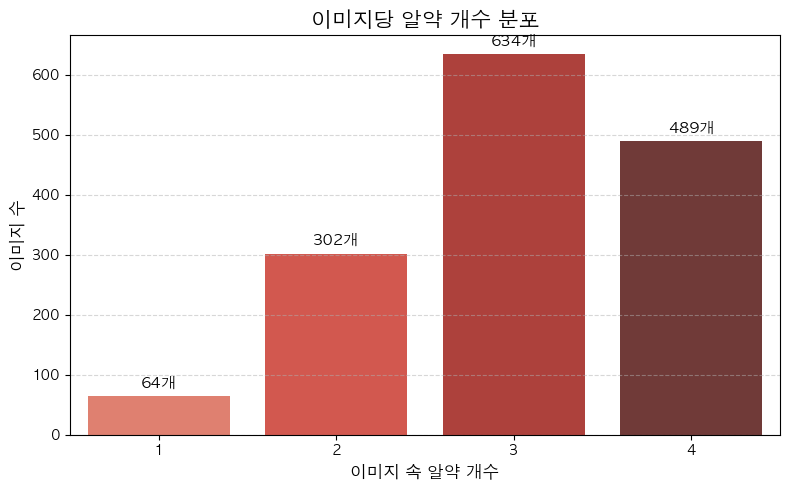

In [24]:
# master_data에서 이미지별 알약 개수(ann_count)를 뽑아 리스트로 만든다
ann_counts_list = []
for img_data in master_data.values():
    ann_counts_list.append(len(img_data['annotations']))

# 개수별로 카운트
count_distribution = Counter(ann_counts_list)

# DataFrame으로 변환
count_df = pd.DataFrame(count_distribution.items(), columns = ['pill_count', 'image_count'])
# 'pill_count' (알약 개수) 기준으로 오름차순 정렬
count_df = count_df.sort_values(by = 'pill_count', ascending = True).reset_index(drop = True)

print("이미지당 알약 개수 분포")
print(count_df.to_string())

# 시각화 (Bar Plot)
plt.figure(figsize=(8, 5))
ax = sns.barplot(
    x='pill_count',
    y='image_count',
    data=count_df,
    palette='Reds_d'
)

# 각 막대 위에 이미지 개수 텍스트 추가
for p in ax.patches:
    ax.annotate(f"{int(p.get_height())}개",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center',
                xytext = (0, 9),
                textcoords = 'offset points',
                fontsize = 11)

plt.title('이미지당 알약 개수 분포', fontsize = 15)
plt.xlabel('이미지 속 알약 개수', fontsize = 12)
plt.ylabel('이미지 수', fontsize = 12)
plt.xticks(fontsize = 10)
plt.grid(axis = 'y', linestyle = '--', alpha = 0.5)
plt.tight_layout()
plt.savefig('pill_count_distribution_bar_plot_clean.png')
plt.show()

- 이미지당 최대 4개의 이미지가 있다
- 대부분 이미지당(약 75%) 3 - 4개의 알약이 있다
    - 객체들이 서로 겹쳐져 있을 수도 있어서 NMS (Non-Maximum Suppression) 임계값이 중요할 수도 있다 임계값이 너무 낮으면 겹쳐진 정상 알약을 제거할 수 있고, 너무 높으면 중복 탐지를 제거하지 못할 수 있는걸 유의한다
    - 다양한 알약들이 있을테니 다양한 크기의 물체를 동시에 잘 탐지하기 위해 FPN을 사용해볼 수도 있겠다
- 눈으로 대충 봤을 때 1 - 2개짜리는 없었던 것 같다 더 자세히 확인을 해본다

#### 파일명 기준 이미지별 알약 개수 분포

In [25]:
# 'K-ID' 개수를 저장할 리스트
true_counts_list = []
# 'K-ID' 패턴이 아닌 파일명을 저장할 리스트
filenames_without_k_ids = []

# master_data의 1,489개 이미지 파일명을 모두 순회
for img_filename in master_data.keys():

    try:
        # 파일명에서 "True Count"를 파싱

        # '_'를 기준으로 앞부분만 추출
        # 예: 'K-001900-016548-018110-027926'
        base_name = img_filename.split('_')[0]

        # 'K-' ID 패턴인지 확인
        if not base_name.startswith('K-'):
            filenames_without_k_ids.append(img_filename)
            continue # K-ID 파일이 아니면 건너뜀

        # '-'를 기준으로 K-ID들을 분리
        # 예: ['K', '001900', '016548', '018110', '027926']
        k_parts = base_name.split('-')

        # 'K'를 제외한 ID 개수 (예: 5 - 1 = 4)
        true_count = len(k_parts) - 1

        true_counts_list.append(true_count)

    except Exception as e:
        # 혹시 모를 파싱 오류
        print(f"파싱 오류 발생: {img_filename}, 오류: {e}")

# "True Count"의 분포를 집계한다
if true_counts_list:
    # Counter를 사용해 개수별 빈도 계산
    count_distribution = Counter(true_counts_list)

    # DataFrame으로 변환
    count_df = pd.DataFrame(count_distribution.items(),
                            columns=['알약 개수 (파일명 기준)', '이미지 수'])
    count_df = count_df.sort_values(by='알약 개수 (파일명 기준)').reset_index(drop=True)

    print("\n" + "="*50)
    print("파일명(True Count) 기준, 이미지별 알약 개수 분포")
    print("="*50)
    print(count_df.to_string(index=False))
else:
    print("\n[코드 검증 결과]")
    print("K-ID 패턴을 가진 이미지 파일을 찾을 수 없습니다.")

if filenames_without_k_ids:
    print("\n" + "="*50)
    print(f"참고: {len(filenames_without_k_ids)}개 파일은 K-ID 패턴이 아님")
    # 예시 5개만 출력
    print(filenames_without_k_ids[:5])


파일명(True Count) 기준, 이미지별 알약 개수 분포
 알약 개수 (파일명 기준)  이미지 수
              3    294
              4   1195


- 1489개의 이미지에서 이미지당 알약 개수가 무조건 3 - 4개인건 확실해 보인다
- 그런데 위에선 1 - 2개짜리가 있다고 했다 레이블이 누락된 것 같다

#### 클린셋 & 오류셋 확인

In [26]:
# 결과를 저장할 리스트
error_records = []
clean_files = []
missing_label_files = []

# master_data의 모든 이미지를 검사 (1489개)
for img_filename, data in master_data.items():

    # 1. 파일명에서 "True Count" 파싱
    # 'K-001900-016548-018110-027926_0_...png'

    # '_'를 기준으로 앞부분만 추출
    base_name = img_filename.split('_')[0]
    # 'K-001900-016548-018110-027926'

    # '-'를 기준으로 K-ID들을 분리
    k_parts = base_name.split('-')
    # ['K', '001900', '016548', '018110', '027926']

    # 'K'를 제외한 ID 개수
    true_count = len(k_parts) - 1

    # 2. 어노테이션에서 "Annotation Count" 파악
    annotation_count = len(data['annotations'])

    # 3. 두 개수 비교
    if true_count == annotation_count:
        # 두 개수가 일치 = 완벽한 데이터
        clean_files.append(img_filename)

    else:
        # 두 개수가 불일치 = 오류 데이터
        error_records.append({
            'filename': img_filename,
            'true_count': true_count,          # 파일명 기준 개수
            'annotation_count': annotation_count # JSON 기준 개수
        })

        if annotation_count < true_count:
            # 발견한 "레이블 누락" (예: 파일명 4개, 어노테이션 1개)
            missing_label_files.append(img_filename)
        # else:
            # (만약 있다면) 어노테이션이 더 많은 경우

# 결과 분석
print(f"총 {len(master_data)}개 이미지 검사 완료\n")
print("="*50)
print(f"[클린셋] 개수 일치: {len(clean_files)}개")
print(f"[오류셋] 개수 불일치: {len(error_records)}개")
print("="*50)

if error_records:
    # 오류 상세 내용 (상위 20개)
    error_df = pd.DataFrame(error_records)
    print("\n[오류 상세 내역 (개수 불일치 Top 20)]")
    print(error_df.head(20).to_string())

    # 오류 유형별 집계
    print("\n[오류 유형별 집계]")
    print(error_df.groupby(['true_count', 'annotation_count']).size())

총 1489개 이미지 검사 완료

[클린셋] 개수 일치: 639개
[오류셋] 개수 불일치: 850개

[오류 상세 내역 (개수 불일치 Top 20)]
                                                filename  true_count  annotation_count
0   K-003483-025367-027777-035206_0_2_0_2_75_000_200.png           4                 3
1   K-003483-025367-027777-035206_0_2_0_2_90_000_200.png           4                 3
2   K-003483-027733-028763-036637_0_2_0_2_90_000_200.png           4                 2
3   K-001900-016551-024850-027926_0_2_0_2_90_000_200.png           4                 2
4   K-001900-016551-024850-027926_0_2_0_2_75_000_200.png           4                 3
5   K-003483-020238-022347-027653_0_2_0_2_90_000_200.png           4                 3
6   K-003483-020238-022347-027653_0_2_0_2_75_000_200.png           4                 3
7   K-003483-016262-025367-027653_0_2_0_2_90_000_200.png           4                 3
8   K-003483-016262-025367-027653_0_2_0_2_75_000_200.png           4                 3
9   K-001900-016548-021771-029451_0_2_0_2_70_0

- 1489개의 전체 학습 데이터 중 850개가 파일명에 명시된 개수보다 적은 수의 어노테이션을 가진 오류셋임을 최종 확인했다
- 이 850개의 오류셋을 그대로 학습에 사용한다면 모델은 4개의 알약이 보여도 3개만 탐지하라는 잘못된 정보를 학습하게 될 수 있다
- 원래도 데이터가 많은 느낌은 아니었는데 거의 절반을 못쓰게 되었다
- 학습을 할 때 무조건 오류셋은 놔두고 학습을 한다

클린셋 639개 기반 의사 레이블링 계획
- 1단계: "클린셋" 분리 및 "베이스라인" 모델 학습
    - 데이터 분리:
        - 전체 1,489개 이미지를 2개 그룹으로 분리
        - "클린셋" (Clean Set): 639개 (파일명 개수 == 어노테이션 개수인 완벽한 데이터)
        - "오류셋" (Error Set): 850개 (파일명 개수 != 어노테이션 개수인 "레이블 누락" 데이터)
        - 검증셋 구성: "클린셋" (639개) 안에서만 8:2 등으로 훈련/검증 데이터 분리
        - 예: train_clean (약 575개) / val_clean (약 64개)
        - "베이스라인" 모델 학습: train_clean (575개) 데이터로만 베이스라인 모델을 학습시킴
        - 데이터가 639개뿐이므로 과적합 위험이 매우 높음 Copy-Paste, Mosaic 등 강력한 데이터 증강(Augmentation)이 필요할 수 있음

- 2단계: "오류셋" 예측 및 레이블 필터링
    - 예측:
        - 1단계에서 학습시킨 "베이스라인 모델"을 "오류셋" 850장 이미지에 대해 실행시킴

- 3단계: 의사 레이블링
    - 목표: "오류셋"(850개) 의사 레이블링

- 4단계: "최종" 모델 재학습
    - 최종 데이터셋 구성:
        - train_clean (약 575개) + fixed_error_set (850개)
        - 최종 모델 학습:
            - 보강된 전체 학습 데이터(약 1425개)를 사용하여 모델을 처음부터 다시 학습시킴
            - 이 최종 모델은 베이스라인 모델보다 훨씬 많은(수리된) 데이터를 학습했으므로 더 높은 성능을 기대할 수 있다

#### 이미지당 알약 개수 vs BBox 크기 재확인

/var/folders/zh/p90w_k_x3y70qvq9273mm0pc0000gn/T/ipykernel_2310/4071752488.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


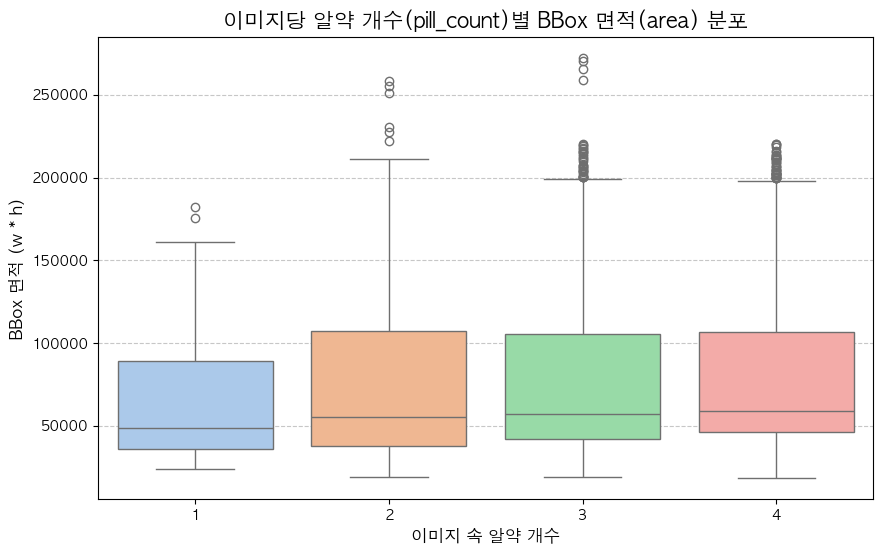

In [27]:
# master_data에서 모든 BBox 정보를 수집
all_bboxes_data = []
ann_counts_map = {}

for img_filename, img_data in master_data.items():

    # 이미지당 알약 개수 미리 계산
    pill_count = len(img_data['annotations'])
    ann_counts_map[img_filename] = pill_count

    for ann in img_data['annotations']:
        x, y, w, h = ann['bbox']

        # BBox 속성 계산 및 리스트에 추가
        all_bboxes_data.append({
            'filename': img_filename,
            'class_name': ann['class_name'],
            'w': w,
            'h': h,
            'area': w * h,
            'x_center': x + w / 2,
            'y_center': y + h / 2,
        })

# DataFrame으로 변환
bbox_df = pd.DataFrame(all_bboxes_data)
# 이미지당 알약 개수 (pill_count) 정보 추가
bbox_df['pill_count'] = bbox_df['filename'].map(ann_counts_map)

plt.figure(figsize = (10, 6))
sns.boxplot(
    x='pill_count',
    y='area',
    data=bbox_df,
    palette='pastel'
)
plt.title('이미지당 알약 개수(pill_count)별 BBox 면적(area) 분포', fontsize = 15)
plt.xlabel('이미지 속 알약 개수', fontsize = 12)
plt.ylabel('BBox 면적 (w * h)', fontsize = 12)
plt.grid(axis = 'y', linestyle = '--', alpha = 0.7)
plt.savefig('pill_count_vs_area_boxplot.png')

- 원래 직관대로라면 이미지에 알약이 4개나 있으면 BBox가 줄어들거라 생각되지만(줌아웃을 하거나 작은약만 넣어야 될 수 있으니) 2 3 4개일 때의 중앙값과 분포가 거의 동일하다
- 데이터셋이 매우 엄격하게 통제된 환경에서 촬영이 된 것 같다
- 2 3 4개일때 모두 완전히 동일한 조건에서 찍혔다고 봐도 되는데 아까 2개가 있는 이미지는 없다고 했었다 그런데 모든 환경이 거의 똑같은데 BBox 크기가 똑같다는건 알약의 물리적인 크기 자체가 같다는 것 같다 다른점은 어노테이션의 개수 밖에 없는 것 같다
- 1개짜리도 아까 없다는걸 확인했다 그런데 분포가 아래쪽에 있다 이 64개는 다른 약들보다 더 작은 약들일 것이다
- 알약 개수에 따른 BBox 크기 편향은 없다고 봐도 될 것 같다

## 이미지 분석

### 이미지 크기 확인

In [28]:
# 이미지 속성 분석 시작
# master_data에서 이미지 크기 정보를 수집
image_properties = []
for img_filename, img_data in master_data.items():
    w = img_data['width']
    h = img_data['height']
    image_properties.append({
        'filename': img_filename,
        'width': w,
        'height': h,
    })

# DataFrame으로 변환
img_df = pd.DataFrame(image_properties)

print(f"총 {len(img_df)}개의 이미지 속성 분석")

# 이미지 크기(w, h) 통계
print("\n" + "=" * 50)
print("이미지 크기 (Width, Height) 통계")
# .describe()로 통계 확인
print(img_df[['width', 'height']].describe().to_string())

# 이미지 크기(w, h) 고유값 확인
print("\n" + "=" * 50)
print("이미지 크기 고유값")
# .groupby()로 (w, h) 조합별 개수 확인
size_counts = img_df.groupby(['width', 'height']).size().reset_index(name='count')
print(size_counts.to_string())

총 1489개의 이미지 속성 분석

이미지 크기 (Width, Height) 통계
        width  height
count  1489.0  1489.0
mean    976.0  1280.0
std       0.0     0.0
min     976.0  1280.0
25%     976.0  1280.0
50%     976.0  1280.0
75%     976.0  1280.0
max     976.0  1280.0

이미지 크기 고유값
   width  height  count
0    976    1280   1489


- 이미지 크기는 모두 976 X 1280으로 균일하다
- 이미지를 입력할 때는 수월할 것 같다 이미지 크기 리사이즈, 패딩, 크롭 같은 전처리 작업은 따로 하지 않아도 될 수도 있겠다
- YOLO를 사용할 때는 처음에는 640으로 넣는걸 고려해본다

### 이미지 속성 확인

In [32]:
# 분석 대상 속성 (JSON 파일의 'images' 섹션에서 추출)
# back_color: 배경색, light_color: 조명색, camera_la/lo: 카메라 각도, 'size' 추가
CAPTURE_PROPERTIES = ['back_color', 'light_color', 'camera_la', 'camera_lo', 'drug_dir', 'size']

# 데이터를 통합할 딕셔너리
# Key: 이미지 파일 이름, Value: 해당 이미지의 캡처 속성
image_capture_agg = {}

for json_path in tqdm(json_files, desc="Processing JSON files"):
    try:
        with open(json_path, 'r', encoding='utf-8') as f:
            data = json.load(f)

        if not data.get('images'):
            continue

        img_info = data['images'][0]
        img_filename = img_info['file_name']

        # 이미지당 캡처 정보는 하나만 존재하므로, 중복 저장 방지
        if img_filename not in image_capture_agg:
            record = {}
            for prop in CAPTURE_PROPERTIES:
                # 속성값을 추출 (값이 없으면 'N/A'로 처리)
                record[prop] = img_info.get(prop, 'N/A')

            image_capture_agg[img_filename] = record

    except Exception as e:
        # print(f"Error processing {json_path}: {e}") # 에러 메시지 출력은 생략
        continue

# DataFrame으로 변환
capture_df = pd.DataFrame.from_dict(image_capture_agg, orient='index')
capture_df = capture_df.reset_index().rename(columns={'index': 'filename'})

# 캡처 환경 다양성 분석
# 고유값 개수 (다양성)
print("\n1. 캡처 환경 속성별 고유값 개수 (다양성)")
for prop in CAPTURE_PROPERTIES:
    print(f"- {prop:<10}: {capture_df[prop].nunique()}개의 고유값")

# 배경색 분포 (가장 중요한 편향 요소)
print("\n2. 배경색 (back_color) 분포 (Top 5)")
print(capture_df['back_color'].value_counts().head(5).to_string())

# 조명색 분포
print("\n3. 조명색 (light_color) 분포")
print(capture_df['light_color'].value_counts().head(5).to_string())

# 카메라 각도 통계 (수치형 속성)
print("\n4. 카메라 각도 및 크기 (camera_la, camera_lo, size) 통계")
# camera_la, camera_lo, size에 대해 describe()를 통해 통계 확인
print(capture_df[['camera_la', 'camera_lo', 'size']].describe().to_string())

Processing JSON files: 100%|██████████| 4526/4526 [00:00<00:00, 6662.09it/s]


1. 캡처 환경 속성별 고유값 개수 (다양성)
- back_color: 1개의 고유값
- light_color: 1개의 고유값
- camera_la : 3개의 고유값
- camera_lo : 1개의 고유값
- drug_dir  : 2개의 고유값
- size      : 1개의 고유값

2. 배경색 (back_color) 분포 (Top 5)
back_color
연회색 배경    1489

3. 조명색 (light_color) 분포
light_color
주백색    1489

4. 카메라 각도 및 크기 (camera_la, camera_lo, size) 통계
         camera_la  camera_lo    size
count  1489.000000     1489.0  1489.0
mean     78.331095        0.0   200.0
std       8.498805        0.0     0.0
min      70.000000        0.0   200.0
25%      70.000000        0.0   200.0
50%      75.000000        0.0   200.0
75%      90.000000        0.0   200.0
max      90.000000        0.0   200.0


- file_name = 이미지 파일의 이름
- imgfile = 이미지 파일의 이름 (동일한 정보)
- width	= 이미지의 너비 (픽셀)
- height = 이미지의 높이 (픽셀)
- back_color = 알약이 놓인 배경색 (예: '연회색 배경').
- light_color = 알약을 비춘 조명색 (예: '주백색').
- camera_la = 카메라 고도 (Latitude) 각도
- camera_lo	= 카메라 방위각 (Longitude) 각도
- drug_dir = 알약의 방향/면	알약의 앞면 또는 뒷면 정보
- size = 알약이 이미지에 차지하는 크기 스케일 이미지의 확대/축소 정도를 나타내는 상대적 값

    - 배경색 (back_color): 1개의 고유값 (연회색 배경 100%)
    - 조명색 (light_color): 1개의 고유값 (주백색 100%)
        - 배경과 조명은 심각한 과적합 위험이 있다
    - 카메라 방위각 (camera_lo): 1개의 고유값 (0.0 100%)
        - 역시 과적합 위험이 있다
    - 카메라 고도 (camera_la): 3개의 고유값 (70, 75, 90)
    - 알약 방향 (drug_dir): 2개의 고유값 (앞면, 뒷면)

- 아까 예상했듯 극단적으로 통제된 촬영 환경이다
- 배경 조명 모두 100% 동일하다 ColorJitter를 한다
- 방위각도 100% 고정이다 회전 증강은 필수일 수도 있겠다
- 그나마 카메라의 고도와 알약의 방향은 변화가 아주 조금이라도 있다

## BBox 분석

### BBox 속성 확인

In [33]:
# BBox 분석 시작
IMG_W = 976 # 이미지 너비 (상수)
IMG_H = 1280 # 이미지 높이 (상수)

# master_data에서 모든 BBox 정보를 수집하고 DataFrame 생성
all_bboxes_data = []
ann_counts_map = {}

# master_data를 순회하며 데이터 추출
for img_filename, img_data in master_data.items():

    # 이미지당 알약 개수 미리 계산 (이전 셀에서 이미 함)
    pill_count = len(img_data['annotations'])
    ann_counts_map[img_filename] = pill_count

    # 해당 이미지의 모든 BBox 어노테이션 순회
    for ann in img_data['annotations']:
        x, y, w, h = ann['bbox'] # COCO 형식 좌표

        # BBox 속성 계산 및 리스트에 추가 (총 4526개)
        all_bboxes_data.append({
            'filename': img_filename,
            'class_name': ann['class_name'],
            'w': w, # 너비
            'h': h, # 높이
            'area': w * h, # 면적

            # 위치 분석을 위한 중심 좌표 계산
            'x_center': x + w / 2,
            'y_center': y + h / 2,
        })

# 리스트를 DataFrame으로 변환 (4526 행)
bbox_df = pd.DataFrame(all_bboxes_data)
# 'filename' 기준으로 'pill_count' 열 추가 (이전 셀 결과 사용)
bbox_df['pill_count'] = bbox_df['filename'].map(ann_counts_map)

# 1. BBox 절대 크기 통계 (Width, Height, Area)
print("=" * 60)
print("1. BBox 크기 (Width, Height, Area) 통계")
# 너비, 높이, 면적 열의 기술 통계 (.describe()) 출력
print(bbox_df[['w', 'h', 'area']].describe().to_string())

# 2. BBox 종횡비 분석 (Aspect Ratio: w / h)
# 너비/높이 비율 계산하여 'aspect_ratio' 열 추가
bbox_df['aspect_ratio'] = bbox_df['w'] / bbox_df['h']
print("\n" + "=" * 60)
print("2. BBox 종횡비 (Aspect Ratio) 통계")
# 종횡비 열의 기술 통계 출력
print(bbox_df['aspect_ratio'].describe().to_string())

# 종횡비 대략적 분포 계산
total_count = len(bbox_df)
# 0.9 ~ 1.1 사이 (정사각형/원형 유사) 개수 계산
square_ish = len(bbox_df[(bbox_df['aspect_ratio'] >= 0.9) & (bbox_df['aspect_ratio'] <= 1.1)])
# < 0.9 (세로로 긴 형태) 개수 계산
portrait = len(bbox_df[bbox_df['aspect_ratio'] < 0.9])
# > 1.1 (가로로 긴 형태) 개수 계산
landscape = len(bbox_df[bbox_df['aspect_ratio'] > 1.1])
print("\n" + "BBox 종횡비 대략적 분포")
print(f"정사각형/원형에 가까움 (0.9 ~ 1.1): {square_ish/total_count:.1%}") # 41.4%
print(f"세로로 김 (< 0.9): {portrait/total_count:.1%}") # 33.5%
print(f"가로로 김 (> 1.1): {landscape/total_count:.1%}") # 25.2%

# 3. BBox 위치 분포 분석 (Normalized Center)
# 중심 좌표를 0에서 1 사이로 정규화
# x 중심 좌표 / 이미지 너비
bbox_df['x_center_norm'] = bbox_df['x_center'] / IMG_W
# y 중심 좌표 / 이미지 높이
bbox_df['y_center_norm'] = bbox_df['y_center'] / IMG_H
print("\n" + "=" * 60)
print("3. 정규화된 BBox 중심 좌표 (0~1) 통계")
# 정규화된 중심 좌표의 기술 통계 출력
print(bbox_df[['x_center_norm', 'y_center_norm']].describe().to_string())

# 4. 이미지당 알약 개수와 BBox 평균 크기 관계 분석
# 'pill_count' (1, 2, 3, 4) 그룹별로 'area'의 평균, 중앙값, 표준편차 계산
area_by_pill_count = bbox_df.groupby('pill_count')['area'].agg(['mean', 'median', 'std'])
print("\n" + "=" * 60)
print("4. 이미지당 알약 개수별 BBox 면적 통계")
# 결과 DataFrame 출력 (소수점 첫째 자리까지)
print(area_by_pill_count.to_string(float_format="%.1f"))

1. BBox 크기 (Width, Height, Area) 통계
                 w            h           area
count  4526.000000  4526.000000    4526.000000
mean    259.326558   288.745913   78884.169244
std      70.032392   116.951857   47201.727592
min     125.000000   123.000000   18492.000000
25%     209.000000   199.000000   43397.000000
50%     242.000000   231.000000   57452.000000
75%     295.000000   403.000000  106294.750000
max     529.000000   669.000000  272435.000000

2. BBox 종횡비 (Aspect Ratio) 통계
count    4526.000000
mean        0.986265
std         0.310422
min         0.396084
25%         0.758759
50%         1.012592
75%         1.103955
max         2.108374

BBox 종횡비 대략적 분포
정사각형/원형에 가까움 (0.9 ~ 1.1): 41.4%
세로로 김 (< 0.9): 33.5%
가로로 김 (> 1.1): 25.2%

3. 정규화된 BBox 중심 좌표 (0~1) 통계
       x_center_norm  y_center_norm
count    4526.000000    4526.000000
mean        0.498405       0.491009
std         0.258301       0.251547
min         0.146004       0.132812
25%         0.256660       0.257031
50%   

- w = BBox의 너비
- h = BBox의 높이
- x_min = BBox의 좌상단 X 좌표
- y_min = BBox의 좌상단 Y 좌표
- x_center = BBox의 중심 X 좌표 (절대 픽셀)
- y_center = BBox의 중심 Y 좌표 (절대 픽셀)
- aspect_ratio = BBox의 종횡비 (모양 분석)
- x_center_norm = 정규화된 중심 X 좌표 (0 - 1)
- y_center_norm = 정규화된 중심 Y 좌표 (0 - 1)
- class_name = BBox에 연결된 알약 이름
- pill_count = 해당 이미지가 가진 총 알약 개수

1. BBox 크기 통계
    - 평균적으로 높이가 너비보다 더 길다 높이의 표준편차도 더 커서 세로 길이가 너비보다 더 다양한 것 같다

2. BBox 종횡비 통계
    - 가장 많은 비율은 정사각형과 원형이다 평균 0.986 (1.0에 매우 가까움)
    - 1.0 근처의 비율이 가장 많지만, 세로 또는 가로로 긴 형태도 상당수 존재
    - 만약에 앵커 기반 모델을 쓴다면 비율에 맞게 앵커 박스를 맞춰야겠다

3. 정규화된 BBox 중심 좌표(0 - 1) 통계
    - 평균 좌표가 거의 0.5에 가깝다 알약들이 대부분 중앙에 고르게 있는 것 같다
    - 하지만 max를 보면 치명적인 결점(6.88, 7.02)이 있는 것 같다 저 BBox는 수정이나 삭제를 해야겠다

4. 이미지당 알약 개수별 BBox 면적 통계
    - 오히려 개수가 많으면 면적이 커진다
    - 간격이 좁지는 않을 수도 있을 것 같다 아니면 크기가 큰 알약 클래스가 포함이 됐을 수도 있다

### 알약 모양(메타데이터) vs BBox 종횡비(실측) 교차 검증

알약 모양(drug_shape)별 실제 BBox 종횡비(w/h) 통계
              count  mean   std   min   25%   50%   75%   max
drug_shape                                                   
기타            7.000 1.108 0.426 0.751 0.767 0.783 1.534 1.618
원형         1491.000 1.022 0.030 0.948 1.004 1.021 1.040 1.131
육각형          84.000 0.886 0.014 0.864 0.875 0.880 0.893 0.927
장방형        1273.000 0.998 0.408 0.396 0.610 1.036 1.321 2.101
타원형        1462.000 0.926 0.376 0.480 0.631 0.774 1.142 2.108
팔각형          66.000 1.295 0.017 1.251 1.282 1.292 1.306 1.345

메타데이터와 실측값의 논리적 모순

  - 이상치 1 ('원형' 아님): 0개 발견

  - 이상치 2 ('장방형/타원형' 아님): 250개 발견
    -> 예시 클래스 (상위 5개):
class_name
자누메트정 50/850mg           41
제미메트서방정 50/1000mg        36
트라젠타듀오정 2.5/850mg        35
보령부스파정 5mg               22
자누메트엑스알서방정 100/1000mg    19

모양별 종횡비 분포


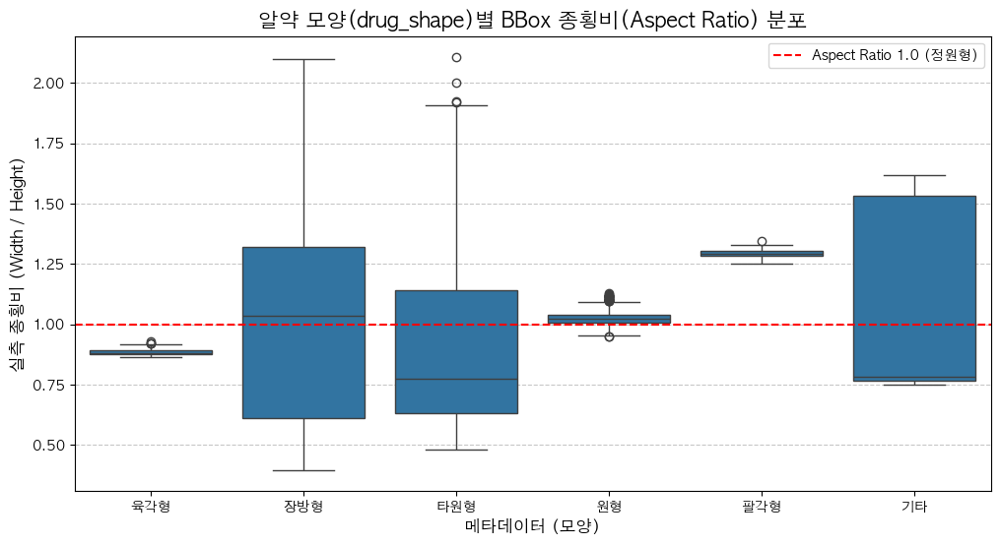

In [34]:
# 데이터 준비
shape_map_df = metadata_all_pills_df[['dl_name', 'drug_shape']].drop_duplicates()

# 'bbox_df'와 'shape_map_df'를 병합 ('class_name'과 'dl_name' 기준)
cross_validation_df = pd.merge(
    bbox_df,
    shape_map_df,
    left_on = 'class_name',
    right_on = 'dl_name',
    how = 'left'
)

# 바로 여기서 '가바토파정 100mg' 같이 'drug_shape' 정보가 없는 데이터는 제외시켜준다
cross_validation_df = cross_validation_df.dropna(subset = ['drug_shape'])

# 모양(Shape)별 종횡비(Aspect Ratio) 통계 분석
print("알약 모양(drug_shape)별 실제 BBox 종횡비(w/h) 통계")
shape_ar_stats = cross_validation_df.groupby('drug_shape')['aspect_ratio'].describe()
print(shape_ar_stats.to_string(float_format = "%.3f"))

# 이상치 탐지: 논리적 모순
print("\n" + "="*70)
print("메타데이터와 실측값의 논리적 모순")

# '원형'인데 종횡비가 1.0에서 크게 벗어난 경우
outlier_circle = cross_validation_df[
    (cross_validation_df['drug_shape'] == '원형') &
    ((cross_validation_df['aspect_ratio'] < 0.7) | (cross_validation_df['aspect_ratio'] > 1.3))
]

# '장방형' 또는 '타원형'인데 종횡비가 1.0에 가까운 경우
outlier_rectangle = cross_validation_df[
    (cross_validation_df['drug_shape'].isin(['장방형', '타원형', '캡슐제'])) &
    (cross_validation_df['aspect_ratio'] >= 0.9) & (cross_validation_df['aspect_ratio'] <= 1.1)
]

print(f"\n  - 이상치 1 ('원형' 아님): {len(outlier_circle)}개 발견")
if len(outlier_circle) > 0:
    print("    -> 예시 클래스 (상위 5개):")
    print(outlier_circle['class_name'].value_counts().head(5).to_string())

print(f"\n  - 이상치 2 ('장방형/타원형' 아님): {len(outlier_rectangle)}개 발견")
if len(outlier_rectangle) > 0:
    print("    -> 예시 클래스 (상위 5개):")
    print(outlier_rectangle['class_name'].value_counts().head(5).to_string())

# 시각화 (Boxplot)
print("\n" + "="*70)
print("모양별 종횡비 분포")

plt.figure(figsize = (12, 6))
sns.boxplot(x = 'drug_shape', y = 'aspect_ratio', data = cross_validation_df)
plt.axhline(y = 1.0, color = 'r', linestyle = '--', label = 'Aspect Ratio 1.0 (정원형)')
plt.title('알약 모양(drug_shape)별 BBox 종횡비(Aspect Ratio) 분포', fontsize = 15)
plt.xlabel('메타데이터 (모양)', fontsize = 12)
plt.ylabel('실측 종횡비 (Width / Height)', fontsize = 12)
plt.legend()
plt.grid(axis = 'y', linestyle = '--', alpha = 0.7)

output_filename = 'shape_vs_aspect_ratio_boxplot.png'
plt.savefig(output_filename)

- 실제 이미지에서 측정된 BBox의 종횡비가 논리적으로 일치하는지 교차 검증했다
- 기대되는 종횡비(w/h)가 명확한 원형과 장방형/타원형 이 두 그룹만 검사했다
- 원형 (Circle): 수학적으로 종횡비(Aspect Ratio)가 무조건 1.0에 가까워야 한다 그래서 (종횡비 < 0.7) 이거나 (종횡비 > 1.3)처럼 1.0에서 크게 벗어나는 놈이 있는지 검사한다 (결과: 0개 발견)
- 장방형 (Rectangle) / 타원형 (Ellipse): 길쭉한 모양이므로 종횡비가 1.0에서 벗어나야 한다 그래서 (종횡비 >= 0.9) 이고 (종횡비 <= 1.1)처럼 오히려 1.0에 가까운 (즉, 정사각형/정원형에 가까운) 놈이 있는지 검사한다 (결과: 250개 발견)
- 나머지 모양(육각형, 팔각형, 기타)은 육각형/팔각형인 경우에는 통계표를 보면 육각형은 평균 0.886, 팔각형은 평균 1.295로, 그 자체로 일관된 종횡비를 가진다 원형이나 장방형처럼 명확한 논리적 모순을 정의하기 애매해서 검사에서 빠졌다
- 기타는 말그대로 기타라서 정해진 형태가 없으므로 검사할 기준 자체가 없다
- 촬영을 어떻게 하느냐에 따라 그리고 약을 어떻게 배치하느냐 등에 따라 BBox의 종횡비가 달라지는 것 같다
    - 저 250개는 이상치가 아니다 촬영 각도 또는 알약의 놓인 방향 때문에 발생하는 자연스러운 현상이라 생각된다
- 오히려 모델이 더 다양하게 학습을 할 수 있을 것 같기도 하다

### BBox 이상치 확인

In [35]:
# 바운딩 박스 이상치 탐지
def find_bbox_outliers(bbox_df, img_w=976, img_h = 1280):
    # 이미지 경계를 벗어나는 바운딩 박스
    out_of_bound = bbox_df[
        (bbox_df['x_center'] - bbox_df['w']/2 < 0) |
        (bbox_df['y_center'] - bbox_df['h']/2 < 0) |
        (bbox_df['x_center'] + bbox_df['w']/2 > img_w) |
        (bbox_df['y_center'] + bbox_df['h']/2 > img_h)
    ]

    # 비정상적으로 작거나 큰 바운딩 박스 (IQR)
    Q1 = bbox_df['area'].quantile(0.25)
    Q3 = bbox_df['area'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    size_outliers = bbox_df[
        (bbox_df['area'] < lower_bound) |
        (bbox_df['area'] > upper_bound)
    ]

    return out_of_bound, size_outliers, lower_bound, upper_bound

# 이상치 탐지 실행
out_of_bound, size_outliers, lower_bound, upper_bound = find_bbox_outliers(bbox_df)

print(f"이미지 경계 벗어난 바운딩 박스: {len(out_of_bound)}개")
print(f"크기 이상치 바운딩 박스: {len(size_outliers)}개")
print(f"이상치 기준 - 작은쪽: {lower_bound:.1f}, 큰쪽: {upper_bound:.1f}")

이미지 경계 벗어난 바운딩 박스: 2개
크기 이상치 바운딩 박스: 74개
이상치 기준 - 작은쪽: -50949.6, 큰쪽: 200641.4


#### BBox 이상치 탐색

In [36]:
# 이상치 상세 분석
# 이미지 경계 벗어난 바운딩 박스 상세
if len(out_of_bound) > 0:
    print("이미지 경계를 벗어난 바운딩 박스:")
    for idx, row in out_of_bound.iterrows():
        print(f"  - 파일: {row['filename']}")
        print(f"    클래스: {row['class_name']}")
        print(f"    위치: ({row['x_center']:.1f}, {row['y_center']:.1f})")
        print(f"    크기: {row['w']}x{row['h']} (면적: {row['area']})")
else:
    print("이미지 경계를 벗어난 바운딩 박스 없음")

print("\n", '=' * 70)

# 크기 이상치 바운딩 박스 상세
if len(size_outliers) > 0:
    print(f"\n크기 이상치 바운딩 박스 ({len(size_outliers)}개):")

    # 너무 큰 바운딩 박스
    too_large = size_outliers[size_outliers['area'] > upper_bound]
    print(f"너무 큰 바운딩 박스: {len(too_large)}개")
    if len(too_large) > 0:
        print("대표적인 큰 바운딩 박스 클래스:")
        print(too_large['class_name'].value_counts().head(5))

    # 너무 작은 바운딩 박스
    too_small = size_outliers[size_outliers['area'] < lower_bound]
    print(f"너무 작은 바운딩 박스: {len(too_small)}개")
    if len(too_small) > 0:
        print("대표적인 작은 바운딩 박스 클래스:")
        print(too_small['class_name'].value_counts().head(5))

이미지 경계를 벗어난 바운딩 박스:
  - 파일: K-003351-016262-018357_0_2_0_2_75_000_200.png
    클래스: 종근당글리아티린연질캡슐(콜린알포세레이트) 
    위치: (6722.5, 782.5)
    크기: 311x315 (면적: 97965)
  - 파일: K-003544-004543-012247-016551_0_2_0_2_70_000_200.png
    클래스: 무코스타정(레바미피드)(비매품)
    위치: (761.5, 8997.5)
    크기: 217x217 (면적: 47089)


크기 이상치 바운딩 박스 (74개):
너무 큰 바운딩 박스: 74개
대표적인 큰 바운딩 박스 클래스:
class_name
자누메트엑스알서방정 100/1000mg       52
오마코연질캡슐(오메가-3-산에틸에스테르90)    12
제미메트서방정 50/1000mg            7
자누메트정 50/850mg               3
Name: count, dtype: int64
너무 작은 바운딩 박스: 0개


- 저 2개는 수정할 수 있으면 수정을 하고 안되면 삭제를 고려해본다
- 저 74개가 아까 BBox 면적을 늘린 것 같다 단순히 그냥 큰 알약들이라 생각되니 삭제하지 않는다
    - 예를 들어 오마코연질캡슐(12개)는 실제 크기가 2.4cm로 연질캡슐이며 삼키기 어려울 정도로 크기가 큰 것으로 매우 유명한 약이라고 한다

### BBox IoU 확인

In [37]:
# master_data에서 모든 BBox 정보를 수집하고 DataFrame 생성

# BBox 종횡비 분석 (Aspect Ratio: w / h)
bbox_df['aspect_ratio'] = bbox_df['w'] / bbox_df['h']
# BBox 위치 분포 분석 (Normalized Center)
bbox_df['x_center_norm'] = bbox_df['x_center'] / IMG_W
bbox_df['y_center_norm'] = bbox_df['y_center'] / IMG_H

# IoU 계산 함수
# IoU 계산 함수 (Intersection over Union)
# BBox 형식: [x_center, y_center, w, h]를 사용하여 계산
def calculate_iou_from_center(box1, box2):
    # 형식: [xc, yc, w, h]
    xc1, yc1, w1, h1 = box1
    xc2, yc2, w2, h2 = box2

    # BBox를 [x_min, y_min, x_max, y_max] 형식으로 변환
    x_min1, y_min1 = xc1 - w1/2, yc1 - h1/2
    x_max1, y_max1 = xc1 + w1/2, yc1 + h1/2

    x_min2, y_min2 = xc2 - w2/2, yc2 - h2/2
    x_max2, y_max2 = xc2 + w2/2, yc2 + h2/2

    # 교차 영역 (Intersection) 좌표
    x_left = max(x_min1, x_min2)
    y_top = max(y_min1, y_min2)
    x_right = min(x_max1, x_max2)
    y_bottom = min(y_max1, y_max2)

    # 교차 영역 면적
    if x_right < x_left or y_bottom < y_top:
        return 0.0 # 교차 영역이 없으면 0.0

    intersection_area = (x_right - x_left) * (y_bottom - y_top)

    # 합집합 영역 (Union) 면적
    area1 = w1 * h1
    area2 = w2 * h2
    union_area = area1 + area2 - intersection_area

    # IoU 계산
    return intersection_area / union_area

# IoU 계산 데이터 준비 및 실행
# 이미지별 BBox 쌍의 IoU 분석
all_iou_values = []
# master_data를 이미지별로 IoU 계산에 필요한 BBox 리스트로 변환
# { 'filename': [[x_center, y_center, w, h], ...], ... }
image_bboxes = defaultdict(list)

# 필요한 컬럼만 추출하여 BBox 리스트 생성 (순서 통일: [x_center, y_center, w, h])
for _, row in bbox_df.iterrows():
    # BBox는 [x_center, y_center, w, h] 형식으로 저장
    bbox_data = [row['x_center'], row['y_center'], row['w'], row['h']]
    image_bboxes[row['filename']].append(bbox_data)

# 이미지별 BBox 쌍 IoU 계산
for filename, bboxes in tqdm(image_bboxes.items(), desc="Calculating IoU"):
    num_bboxes = len(bboxes)
    if num_bboxes < 2:
        continue # 객체가 1개 이하면 IoU 계산 불필요

    # 모든 BBox 쌍에 대해 IoU 계산
    for i in range(num_bboxes):
        for j in range(i + 1, num_bboxes):
            # 수정된 중심 좌표 기반 IoU 함수 사용 (통일된 형식)
            iou = calculate_iou_from_center(bboxes[i], bboxes[j])
            all_iou_values.append(iou)

iou_df = pd.Series(all_iou_values, name='IoU')

print("\n" + "=" * 60)

# IoU 분포 통계
print("\n1. IoU 값 분포 통계")
print(iou_df.describe().to_string())

# 2. 겹침 수준별 BBox 쌍 개수
# IoU 임계값: 0.5 이상은 '높은 겹침', 0.2 이상은 '중간 겹침'으로 분류
HIGH_OVERLAP_THRESHOLD = 0.5
MEDIUM_OVERLAP_THRESHOLD = 0.1

high_overlap = len(iou_df[iou_df >= HIGH_OVERLAP_THRESHOLD])
medium_overlap = len(iou_df[(iou_df >= MEDIUM_OVERLAP_THRESHOLD) & (iou_df < HIGH_OVERLAP_THRESHOLD)])
low_overlap = len(iou_df[iou_df < MEDIUM_OVERLAP_THRESHOLD])

total_pairs = len(iou_df)

print("\n2. BBox 겹침 수준별 개수")
print(f"총 BBox 쌍 개수: {total_pairs}개")
print(f"- 높은 겹침 (IoU >= {HIGH_OVERLAP_THRESHOLD}): {high_overlap}개 ({high_overlap / total_pairs:.1%})")
print(f"- 중간 겹침 ({MEDIUM_OVERLAP_THRESHOLD} <= IoU < {HIGH_OVERLAP_THRESHOLD}): {medium_overlap}개 ({medium_overlap / total_pairs:.1%})")
print(f"- 낮은 겹침 (IoU < {MEDIUM_OVERLAP_THRESHOLD}): {low_overlap}개 ({low_overlap / total_pairs:.1%})")


# IoU >= 0.2인 이미지 파일 탐지
# IoU 임계값을 0.2로 설정하여 중간 겹침까지 포함
# IoU >= 0.1인 이미지 파일 탐지 (임계값을 0.1로 변경)
HIGH_IOU_THRESHOLD = 0.1  # 이 줄만 0.2 → 0.1로 변경
high_iou_files = set()

# image_bboxes 딕셔너리를 사용하여 파일명 기반으로 탐색
for filename, bboxes in image_bboxes.items():
    num_bboxes = len(bboxes)
    if num_bboxes < 2:
        continue # 객체가 1개 이하면 IoU 계산 불필요

    is_high_overlap = False

    # 모든 BBox 쌍에 대해 IoU 계산
    for i in range(num_bboxes):
        for j in range(i + 1, num_bboxes):

            # BBox 데이터 [x_center, y_center, w, h]
            xc1, yc1, w1, h1 = bboxes[i]
            xc2, yc2, w2, h2 = bboxes[j]

            # [x_min, y_min, x_max, y_max] 형식으로 변환
            x_min1, y_min1 = xc1 - w1/2, yc1 - h1/2
            x_max1, y_max1 = xc1 + w1/2, yc1 + h1/2
            x_min2, y_min2 = xc2 - w2/2, yc2 - h2/2
            x_max2, y_max2 = xc2 + w2/2, yc2 + h2/2

            # 교차 영역 (Intersection) 계산
            x_left = max(x_min1, x_min2)
            y_top = max(y_min1, y_min2)
            x_right = min(x_max1, x_max2)
            y_bottom = min(y_max1, y_max2)

            if x_right < x_left or y_bottom < y_top:
                iou = 0.0
            else:
                intersection_area = (x_right - x_left) * (y_bottom - y_top)
                area1 = w1 * h1
                area2 = w2 * h2
                union_area = area1 + area2 - intersection_area
                iou = intersection_area / union_area

            # IoU가 임계값(0.1)을 초과하면 해당 파일명을 기록
            if iou >= HIGH_IOU_THRESHOLD:
                high_iou_files.add(filename)
                is_high_overlap = True
                break
        if is_high_overlap:
            break

print(f"\nIoU >= {HIGH_IOU_THRESHOLD}인 높은/중간 겹침 BBox를 포함하는 이미지 파일:")
for filename in high_iou_files:
    print(f"- {filename}")

Calculating IoU: 100%|██████████| 1489/1489 [00:00<00:00, 348491.64it/s]



1. IoU 값 분포 통계
count    5138.000000
mean        0.001225
std         0.032584
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000

2. BBox 겹침 수준별 개수
총 BBox 쌍 개수: 5138개
- 높은 겹침 (IoU >= 0.5): 5개 (0.1%)
- 중간 겹침 (0.1 <= IoU < 0.5): 4개 (0.1%)
- 낮은 겹침 (IoU < 0.1): 5129개 (99.8%)

IoU >= 0.1인 높은/중간 겹침 BBox를 포함하는 이미지 파일:
- K-002483-003743-012081-019552_0_2_0_2_90_000_200.png
- K-003351-020238-031863_0_2_0_2_70_000_200.png
- K-003483-019861-020238-031885_0_2_0_2_70_000_200.png
- K-003351-003832-029667_0_2_0_2_90_000_200.png
- K-003483-027733-030308-036637_0_2_0_2_90_000_200.png
- K-003351-018147-020238_0_2_0_2_90_000_200.png
- K-001900-016548-019607-033009_0_2_0_2_70_000_200.png
- K-003483-019861-025367-029667_0_2_0_2_90_000_200.png
- K-003351-029667-031863_0_2_0_2_70_000_200.png


- BBox가 겹치는 경우는 거의 없다
    - 통제된 환경이 확실한 것 같다
- 높은/중간 겹침 BBox를 포함하는 이미지 파일들 9개는 직접 확인을 해봐야겠다
- 시각적으로 확인해서 오류면 수정이나 삭제를 고려해본다
- 겹침이 거의 없으므로 NMS(Non-Maximum Suppression) 임계값을 약간만 겹쳐도 중복으로 간주하고 보수적으로 설정할 수도 있겠다

#### IoU 겹침 이상치 확인

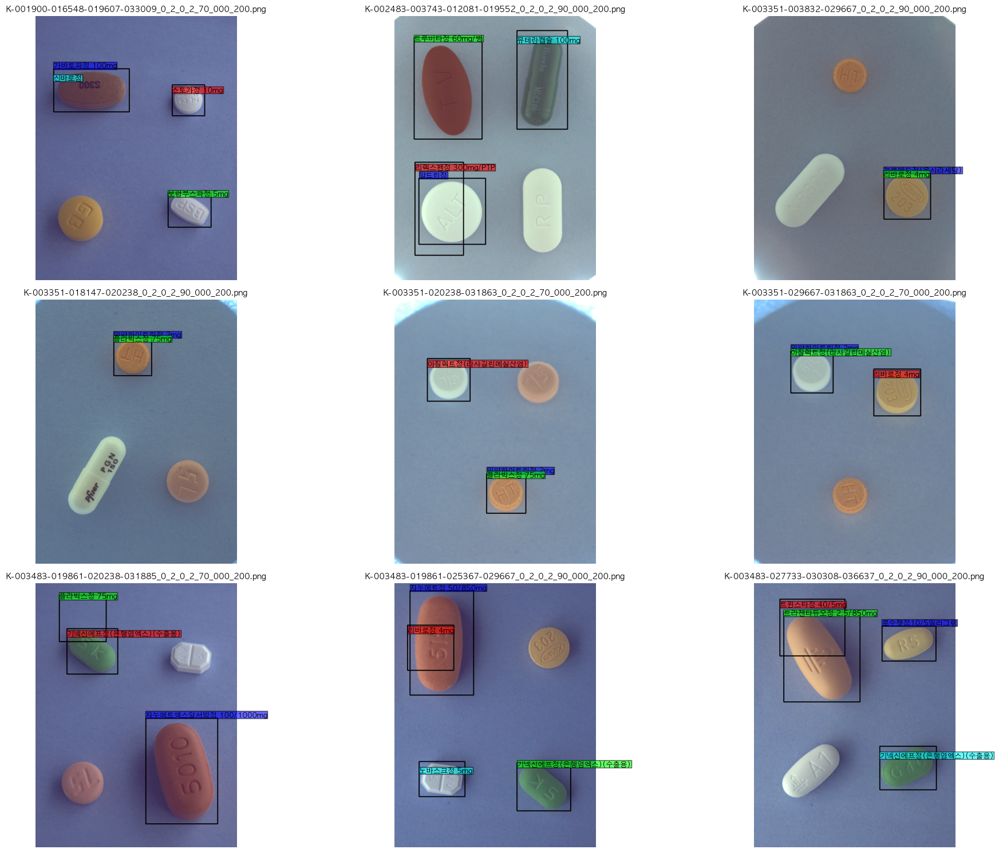

In [38]:
# 9개 파일명 리스트로 변환
overlap_filenames = sorted(list(high_iou_files))

# BBox를 그릴 색상 (B, G, R) - 최대 4개
COLORS = [
    (255, 0, 0),  # Blue
    (0, 255, 0),  # Green
    (0, 0, 255),  # Red
    (255, 255, 0) # Yellow
]

# 3x3 그리드로 설정 (4x2 → 3x3으로 변경)
plt.figure(figsize = (20, 15))  # 사이즈도 약간 조정

for i, img_filename in enumerate(overlap_filenames):
    img_path = os.path.join(train_img_dir, img_filename)

    # 이미지 로드 (OpenCV: BGR)
    image = cv2.imread(img_path)
    if image is None:
        print(f"오류: '{img_path}' 로드 실패. 다음으로 넘어갑니다.")
        continue

    # 이미지 -> RGB (Matplotlib 용)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # master_data에서 어노테이션 정보 가져오기
    annotations = master_data[img_filename]['annotations']

    # 서브플롯 생성 (4,2, i+1 → 3,3, i+1으로 변경)
    plt.subplot(3, 3, i + 1)

    # 이미지에 BBox와 텍스트 그리기
    for j, ann in enumerate(annotations):
        # BBox 좌표 [x, y, w, h]
        x, y, w, h = map(int, ann['bbox'])

        # 클래스 ID로 이름 찾기
        class_id = ann['class_id']
        class_name = id_to_class.get(class_id, "Unknown")

        # 색상 선택 (Matplotlib RGB 0~1 스케일)
        color_bgr = COLORS[j % len(COLORS)]
        color_rgb = (color_bgr[2]/255, color_bgr[1]/255, color_bgr[0]/255)

        # 사각형 그리기
        cv2.rectangle(image_rgb, (x, y), (x + w, y + h), color_rgb, thickness=3)

        # 텍스트 그리기 (j*20 : 텍스트가 겹치지 않게 y위치 살짝 조정)
        plt.text(x, y - 5 + (j*20), class_name,
                 color='black',
                 fontsize=9,
                 bbox=dict(facecolor=color_rgb, alpha=0.6, pad=0.1))

    # 서브플롯에 이미지 표시
    plt.imshow(image_rgb)
    plt.title(f"{img_filename}", fontsize=10)
    plt.axis('off')

plt.tight_layout()
output_filename = 'overlapping_bboxes_visualization.png'
plt.savefig(output_filename)

- 실제로 겹치는 것들이 있다
- 겹치는 것들은 수정을 시도 해보고 안되면 삭제를 한다

### 클래스 불균형 시각화

/var/folders/zh/p90w_k_x3y70qvq9273mm0pc0000gn/T/ipykernel_2300/2225479894.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


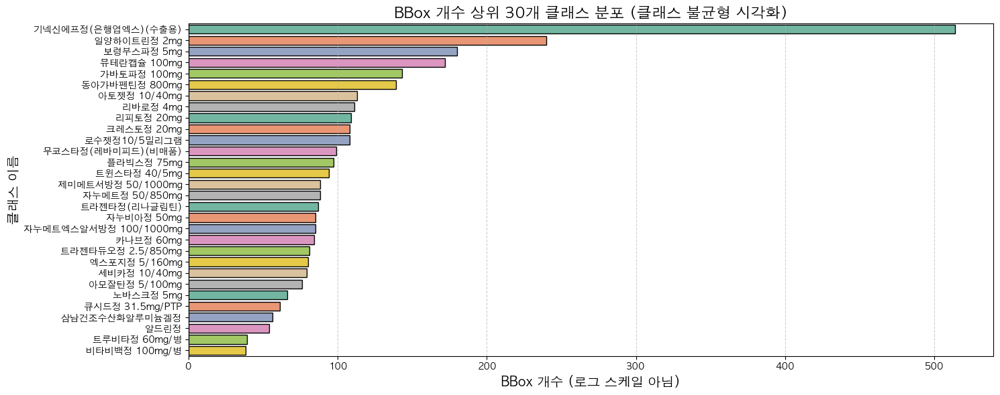


총 73개 클래스 중, BBox 개수 10개 미만(Few-Shot) 클래스: 3개
Few-Shot 클래스 목록 (일부): ['자이프렉사정 2.5mg', '렉사프로정 15mg', '브린텔릭스정 20mg']


In [32]:

import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns

# pill_df는 Cell 11에서 생성된 4526개 BBox 메타데이터 DataFrame이라고 가정
# (만약 DataFrame을 아직 생성하지 않았다면, Cell 11의 코드를 먼저 실행해야 합니다.)
# 여기서는 예시를 위해 master_data에서 직접 생성합니다.

# master_data (Cell 4의 결과)를 사용하여 BBox 레코드 리스트 생성
bbox_records = []
for filename, img_data in master_data.items():
    for ann in img_data['annotations']:
        bbox_records.append(ann['class_name'])

class_counts = Counter(bbox_records)
class_df = pd.DataFrame(class_counts.items(), columns=['Class Name', 'Count']).sort_values(by='Count', ascending=False)

# 상위 N개 클래스만 시각화하여 불균형 강조
top_n = 30
df_to_plot = class_df.head(top_n)

# 시각화 설정 (사용자 요청: 진한 파스텔톤)
plt.figure(figsize=(15, 6))
# 진한 파스텔톤 팔레트 (예시: 'Paired' 팔레트의 진한 색상)
pastel_colors = sns.color_palette("Set2", top_n)
sns.barplot(
    x='Count',
    y='Class Name',
    data=df_to_plot,
    palette=pastel_colors,
    edgecolor='k' # 경계선 추가로 강조
)

plt.title(f'BBox 개수 상위 {top_n}개 클래스 분포 (클래스 불균형 시각화)', fontsize=16)
plt.xlabel('BBox 개수 (로그 스케일 아님)', fontsize=14)
plt.ylabel('클래스 이름', fontsize=14)
plt.xscale('linear') # 데이터가 심하게 기울어져 있다면 'log' 스케일 사용도 고려
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# 정량적 분석: Few-Shot Class (BBox 10개 미만) 개수
few_shot_threshold = 10
few_shot_classes = class_df[class_df['Count'] < few_shot_threshold]
print(f"\n총 {len(class_df)}개 클래스 중, BBox 개수 10개 미만(Few-Shot) 클래스: {len(few_shot_classes)}개")
print(f"Few-Shot 클래스 목록 (일부): {list(few_shot_classes['Class Name'].head(5))}")

위 시각화의 결과로 데이터셋에 가 근본적인 문제인 클래스의 불균형 정도를 파악할 수 있습니다

가장 많은 bbox를 보유한 가넥신은 500개가 넘어가는 표본을 가지고있고 비타비는 50개도 못미치는 결과를 볼 수 있습니다

상위 클래스들은 좋은 학습 결과를 도출하는데 도움이되지만

하위 클래스들은 mAP 점수에 악영향을 줄 가능성을 초래할 수 있습니다

위 현상을 해결하기 위해서는
1. 데이터증강 및 클래스 오버 샘플링
2. 손실함수 전략
3. 모델 선택 근거 (대형모델선택)
등이 해결점이 될 수 있을거 같습니다

### 객체 크기 및 종횡비 분포 분석 ($\text{Small Object}$ 및 $\text{Anchor}$ 분석)

이미지 면적 대비 0.5% 미만(Small Object) BBox 개수: 0개 (0.00%)


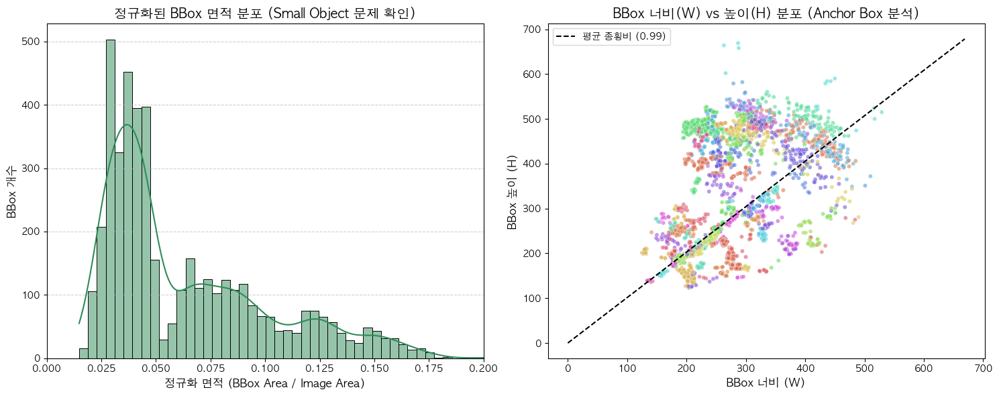

평균 종횡비 (W/H): 0.99


In [33]:
import numpy as np

# pill_df가 메타데이터 DataFrame이라고 가정하고 'bbox' 컬럼을 사용합니다.
# 'bbox' 컬럼이 [x, y, w, h] 리스트 형태로 저장되어 있다고 가정하고 W/H를 계산
# 만약 pill_df가 없다면 master_data의 annotation을 기반으로 DataFrame을 생성해야 합니다.

# 예시로, master_data에서 필요한 정보(BBox, Class Name, Image Info)를 추출하여 DF 생성
data_rows = []
for filename, img_data in master_data.items():
    img_width = img_data['width']
    img_height = img_data['height']
    for ann in img_data['annotations']:
        x, y, w, h = ann['bbox']
        area = w * h
        aspect_ratio = w / h if h > 0 else 0

        data_rows.append({
            'class_name': ann['class_name'],
            'bbox_width': w,
            'bbox_height': h,
            'area': area,
            'aspect_ratio': aspect_ratio,
            'normalized_area': area / (img_width * img_height) # 이미지 크기 대비 BBox 비율
        })
pill_df = pd.DataFrame(data_rows) # 임시 DataFrame 생성

# A. 객체 크기 분포 (Normalized Area)
plt.figure(figsize=(15, 6))

# Histogram (작은 객체에 집중)
# x축: 이미지 면적 대비 BBox 면적 비율 (0.01 = 1%의 면적)
# 진한 파스텔톤 초록색 (맑은 날씨/성공을 상징하는 밝은톤이 아닌 진한 초록)
plt.subplot(1, 2, 1)
sns.histplot(pill_df['normalized_area'], bins=50, kde=True, color='#2E8B57', edgecolor='k', log_scale=False)
plt.title('정규화된 BBox 면적 분포 (Small Object 문제 확인)', fontsize=14)
plt.xlabel('정규화 면적 (BBox Area / Image Area)', fontsize=12)
plt.ylabel('BBox 개수', fontsize=12)
plt.xlim(0, 0.2) # 작은 객체(0~20%) 범위에 집중
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Small Object 통계
small_object_threshold = 0.005 # 이미지 면적 대비 0.5% 미만
small_objects = pill_df[pill_df['normalized_area'] < small_object_threshold]
print(f"이미지 면적 대비 0.5% 미만(Small Object) BBox 개수: {len(small_objects)}개 ({len(small_objects) / len(pill_df) * 100:.2f}%)")

# B. 종횡비 분포 (Aspect Ratio)
plt.subplot(1, 2, 2)
# 종횡비 Scatter Plot (W vs H) - 앵커 최적화 분석
sns.scatterplot(
    x='bbox_width',
    y='bbox_height',
    data=pill_df,
    hue='class_name',
    palette=sns.color_palette("hls", len(pill_df['class_name'].unique())),
    legend=False,
    alpha=0.6,
    s=20 # 점 크기 축소
)
# 평균 종횡비 (W/H)를 선으로 표시하여 앵커 박스 방향 시사
mean_aspect_ratio = pill_df['aspect_ratio'].mean()
max_val = max(pill_df['bbox_width'].max(), pill_df['bbox_height'].max())
plt.plot([0, max_val], [0, max_val / mean_aspect_ratio], linestyle='--', color='k', label=f'평균 종횡비 ({mean_aspect_ratio:.2f})')
plt.title('BBox 너비(W) vs 높이(H) 분포 (Anchor Box 분석)', fontsize=14)
plt.xlabel('BBox 너비 (W)', fontsize=12)
plt.ylabel('BBox 높이 (H)', fontsize=12)
plt.legend(fontsize=10)
plt.tight_layout()
plt.show()

print(f"평균 종횡비 (W/H): {mean_aspect_ratio:.2f}")

다음 그래프로 도출할 수 있는 문제점은
1. small object 문제가 심각하다
2. Anchor Box 최적화가 필요하다
입니다
개선 방법으로는 입력해상도를 높여서 작은 픽정보를 보존하는 방법과
작은 개체를 인위적으로 늘리거나 큰 이미지 부분으로 만들어서 모델이 학습하도록 유도하는 방법이있습니다
그리고 현재 데이터셋의 W vs H 분포에 가장 잘 맞는 Anchor 크기를 계산하여 IoU를 극대화 하는 방법이 있습니다

### 알약 모양(drug_shape)별 난이도 분석

In [34]:
data_rows = []
processing_errors = 0

# 4526개의 모든 JSON 파일을 순회하여 BBox 레코드 생성
# glob.glob()으로 찾은 json_files 변수를 사용합니다.
for json_path in tqdm(json_files, desc="Metadata integration"):
    try:
        with open(json_path, 'r', encoding='utf-8') as f:
            data = json.load(f)

        # 1. 약물 메타데이터 (Drug-level metadata, BBox에 모두 적용되어야 함)
        img_info = data['images'][0]

        # BBox 정보 (COCO: [x, y, w, h])
        ann_list = data['annotations']

        # 클래스 정보
        category_map = {cat['id']: cat['name'] for cat in data['categories']}

        # 2. BBox와 메타데이터 병합
        for ann in ann_list:
            ann_cat_id = ann['category_id']
            if ann_cat_id not in category_map:
                processing_errors += 1
                continue

            class_name = category_map[ann_cat_id]
            x, y, w, h = ann['bbox'] # [x, y, w, h] COCO 포맷

            # BBox-specific data
            row = {
                'file_name': img_info['file_name'],
                'class_name': class_name,
                'bbox_w': w,
                'bbox_h': h,
                'bbox_area': w * h,
                'aspect_ratio': w / h if h > 0 else 0,
            }

            # Drug-level metadata (필요한 메타데이터 키를 리스트로 지정)
            metadata_keys = ['drug_shape', 'dl_company', 'color_class1', 'thick', 'leng_long', 'leng_short']
            for key in metadata_keys:
                row[key] = img_info.get(key, None)

            data_rows.append(row)

    except Exception as e:
        processing_errors += 1

pill_df = pd.DataFrame(data_rows)

print(f"\n[필수 수정 완료] 총 {len(pill_df)}개의 BBox 레코드를 포함하는 pill_df DataFrame 생성 완료.")
print(f"처리 오류 발생 JSON 파일 수: {processing_errors}개")
print(f"컬럼 확인 (drug_shape 포함): {list(pill_df.columns)}")

Metadata integration: 100%|██████████| 4526/4526 [00:00<00:00, 28598.53it/s]


[필수 수정 완료] 총 4526개의 BBox 레코드를 포함하는 pill_df DataFrame 생성 완료.
처리 오류 발생 JSON 파일 수: 0개
컬럼 확인 (drug_shape 포함): ['file_name', 'class_name', 'bbox_w', 'bbox_h', 'bbox_area', 'aspect_ratio', 'drug_shape', 'dl_company', 'color_class1', 'thick', 'leng_long', 'leng_short']


### 알약 모양(Drug Shape)별 BBox 개수 분포 시각화


/var/folders/zh/p90w_k_x3y70qvq9273mm0pc0000gn/T/ipykernel_2300/2137491346.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


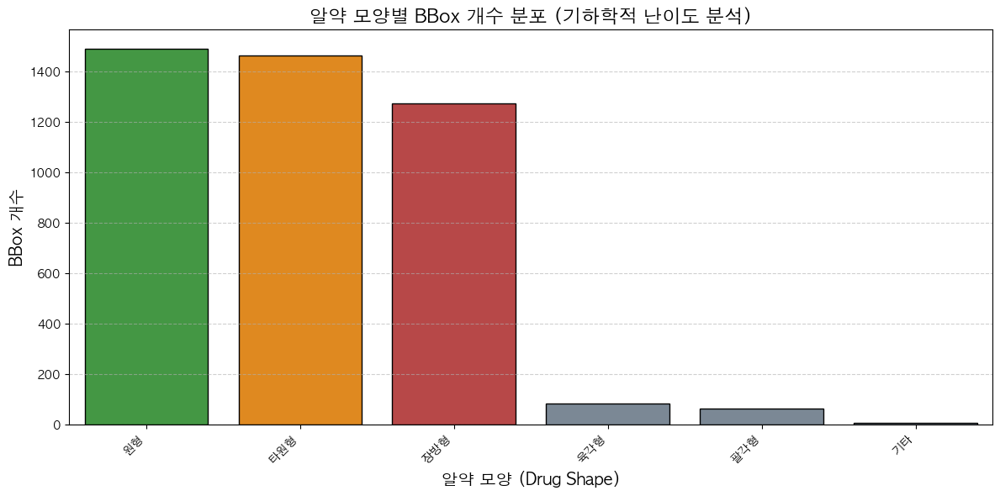


총 BBox 개수: 4526개
장방형 비율: 28.13%
원형 비율: 32.94%
타원형 비율: 32.30%


In [35]:
# --- 1. 데이터 추출 ---
# pill_df가 앞에서 성공적으로 생성되었다고 가정합니다.
shape_counts = pill_df['drug_shape'].value_counts()

# --- 2. 색상 정의 및 시각화 ---
# 사용자 요청: 컬럼 의미 있는 색상 적용
shape_colors = {
    '장방형': '#C93636',  # 진한 빨강 계열 (난이도 높음)
    '원형': '#36A536',   # 진한 초록 계열 (난이도 낮음)
    '타원형': '#FF8C00', # 진한 주황 계열 (중간 난이도)
    '기타': '#778899',    # 회색
    '마름모형': '#9370DB', # 연한 보라
    '삼각형': '#4682B4'   # 연한 파랑
}

# 시각화
plt.figure(figsize=(12, 6))
# value_counts() 결과의 index를 색상 맵핑 키로 사용
plot_colors = [shape_colors.get(shape, '#778899') for shape in shape_counts.index]
sns.barplot(
    x=shape_counts.index,
    y=shape_counts.values,
    palette=plot_colors,
    edgecolor='k'
)

plt.title('알약 모양별 BBox 개수 분포 (기하학적 난이도 분석)', fontsize=16)
plt.xlabel('알약 모양 (Drug Shape)', fontsize=14)
plt.ylabel('BBox 개수', fontsize=14)
plt.xticks(rotation=45, ha='right') # x축 레이블 회전
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# 정량 분석
total_bbox = len(pill_df)
print(f"\n총 BBox 개수: {total_bbox}개")
print(f"장방형 비율: {shape_counts.get('장방형', 0) / total_bbox * 100:.2f}%")
print(f"원형 비율: {shape_counts.get('원형', 0) / total_bbox * 100:.2f}%")
print(f"타원형 비율: {shape_counts.get('타원형', 0) / total_bbox * 100:.2f}%")

위 그래프로 개선해야할 점을 요약하자면

IoU최적화를 위한 AnchorBox 조정장방형과 타원형 알약이 전체 BBox의 과반수 이상을 차지합니다.

이들의 종횡비 분포가 YOLOv8의 기본Anchor Box 비율과 맞지 않을 가능성이 높다고 보여집니다

BBox의 W/H 데이터를 기반으로 K-Means 클러스터링을 실행하여 이 데이터셋에 최적화된 Custom Anchor를 계산하고 적용해야 정확도를 높일 수 있다고 보여집니다



장방형 알약의 높은 비율때문에 모델은 다양한 각도로 기울어진 알약을 잘 인식해야합니다

yolo를 학습할때 회원 및 전단 하이퍼파라미터 값을 기본값으로 높게 설정하여 모델이 회전변형에 문제없이 학습할 수 있도록 강제해야 합니다

### Bounding Box 중심점 Heatmap 시각화


✅ JSON 파일 로드 완료. 총 4526개 파일 처리 시작.


BBox Metadata Integration: 100%|██████████| 4526/4526 [00:00<00:00, 7907.36it/s]



[데이터 통합 완료] 총 4526개의 BBox 레코드 처리.


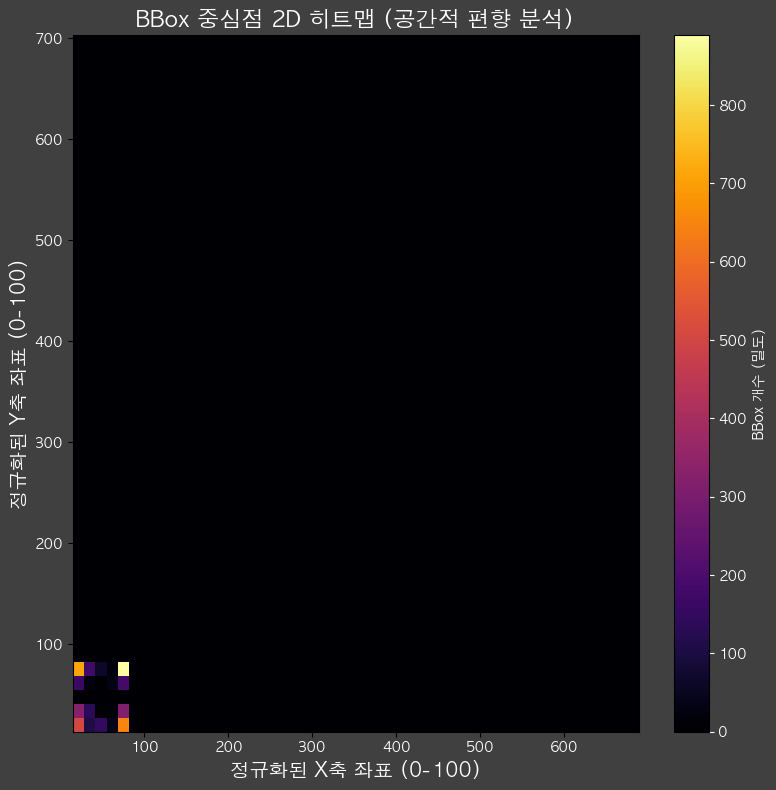

In [40]:
# --- 0. 필수 라이브러리 및 경로 설정 ---
import pandas as pd
import json
import glob
import os
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# 사용자 지정 경로 반영
base_dir = "data/raw/"
train_ann_dir = os.path.join(base_dir, "train_annotations")

# --- 1. JSON 파일 로드 및 pill_df 재생성 ---
data_rows = []
try:
    # 경로에 맞는 모든 JSON 파일 경로 검색
    json_files = glob.glob(os.path.join(train_ann_dir, "**", "*.json"), recursive=True)

    if not json_files:
        print(f"🛑 오류: 지정된 경로 ({train_ann_dir})에서 JSON 파일을 찾을 수 없습니다. 경로를 확인하세요.")
        raise FileNotFoundError

    print(f"✅ JSON 파일 로드 완료. 총 {len(json_files)}개 파일 처리 시작.")

    for json_path in tqdm(json_files, desc="BBox Metadata Integration"):
        with open(json_path, 'r', encoding='utf-8') as f:
            data = json.load(f)

        img_info = data['images'][0]
        img_w = img_info['width']
        img_h = img_info['height']
        ann_list = data['annotations']

        for ann in ann_list:
            x, y, w, h = ann['bbox'] # [x, y, w, h] COCO 포맷

            # BBox 좌표 및 이미지 크기 정보 추가
            data_rows.append({
                'bbox_x': x, 'bbox_y': y, 'bbox_w': w, 'bbox_h': h,
                'img_w': img_w, 'img_h': img_h,
            })

except Exception as e:
    print(f"\n🛑 치명적 데이터 로드 오류 발생: {e}")

pill_df = pd.DataFrame(data_rows)

# --- 2. Heatmap 계산 및 시각화 ---
if pill_df.empty:
    print("🛑 오류: pill_df에 데이터가 없습니다.")
else:
    print(f"\n[데이터 통합 완료] 총 {len(pill_df)}개의 BBox 레코드 처리.")

    # 중심점 좌표 계산 및 정규화 (0~100 스케일)
    center_x = pill_df['bbox_x'] + (pill_df['bbox_w'] / 2)
    center_y = pill_df['bbox_y'] + (pill_df['bbox_h'] / 2)

    normalized_center_x = (center_x / pill_df['img_w']) * 100
    normalized_center_y = (center_y / pill_df['img_h']) * 100

    # 시각화
    plt.figure(figsize=(8, 8))

    # 히트맵 생성 (진한 파스텔톤 규칙을 따르기 위해 'inferno' 팔레트 사용)
    plt.hist2d(
        normalized_center_x,
        normalized_center_y,
        bins=[50, 50],
        cmap='inferno'
    )

    # 시각화 설정 (어두운 배경, 흰색 텍스트로 가독성 높임)
    cbar = plt.colorbar(label='BBox 개수 (밀도)')
    cbar.ax.yaxis.label.set_color('white')
    cbar.ax.tick_params(colors='white')

    plt.title('BBox 중심점 2D 히트맵 (공간적 편향 분석)', fontsize=16, color='white')
    plt.xlabel('정규화된 X축 좌표 (0-100)', fontsize=14, color='white')
    plt.ylabel('정규화된 Y축 좌표 (0-100)', fontsize=14, color='white')
    plt.xticks(color='white')
    plt.yticks(color='white')

    plt.gca().set_facecolor('#404040')
    plt.gcf().set_facecolor('#404040')

    plt.tight_layout()
    plt.show()

이 시각화로 알 수 있는것은

공간적 편향이 있음을 바로 알 수 있습니다

히트맵에서 밝은 영역이 이미지의 정중앙에 압도적으로 집중되어있고

이로써 알 수 있는것은 학습 데이터셋의 알약들이 이미지 촬영시 정중앙에 가있도록 한것입니다

만약 알약이 정중앙에 배치되지않는다면 탐지율이 크게 떨어지는 현상이 발생할 확률이 높습니다

이 문제를 해결하기 위해선 평행이동, 증강검토, 랜덤자르기를 활용할 수 있을것으로 보입니다

### Bounding Box 크기 (면적) 히스토그램 시각화


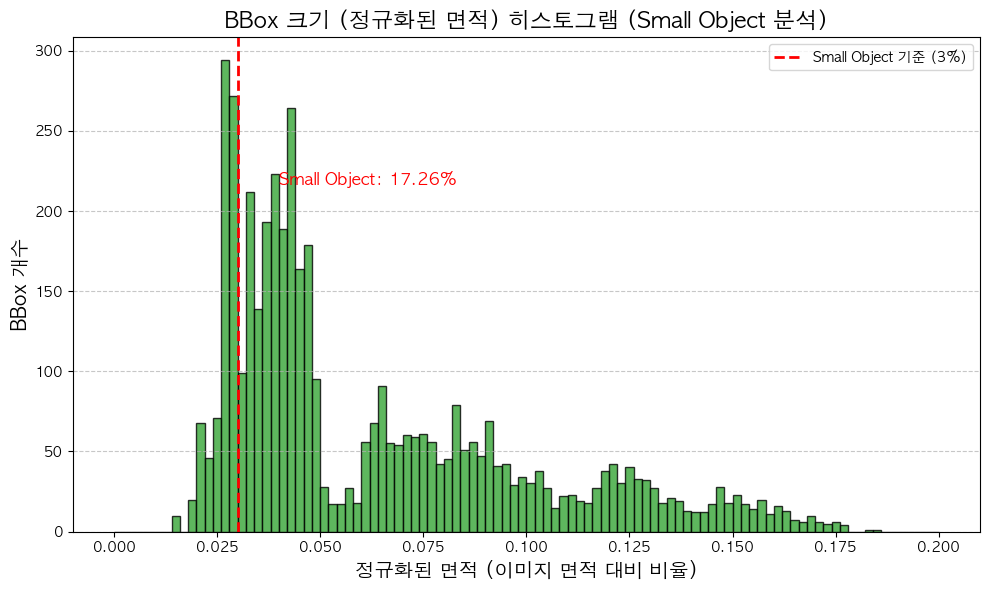

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import font_manager, rc
import os


# --- 1. BBox 면적 계산 및 정규화 ---
if pill_df.empty:
    print("🛑 오류: pill_df에 데이터가 없습니다. 이전 JSON 로드 셀을 확인하세요.")
else:
    # 1.1. BBox 면적 계산 (W * H)
    pill_df['bbox_area'] = pill_df['bbox_w'] * pill_df['bbox_h']

    # 1.2. 이미지 전체 면적 계산 (정규화를 위해)
    pill_df['img_area'] = pill_df['img_w'] * pill_df['img_h']

    # 1.3. 정규화된 면적 (전체 이미지 대비 비율)
    # 이미지 크기가 모두 동일하지 않으므로, 개별 이미지 크기로 정규화
    normalized_area = pill_df['bbox_area'] / pill_df['img_area']

    # --- 2. 히스토그램 시각화 ---
    plt.figure(figsize=(10, 6))

    # 데이터가 0에 몰려 있으므로, 0.2까지만 잘라서 확대해서 봅니다.
    # bins=100을 사용하여 세밀한 분포를 확인합니다.
    plt.hist(normalized_area, bins=100, range=(0, 0.2), color='#36A536', edgecolor='black', alpha=0.8) # 맑은 날씨면 초록색 규칙 적용

    plt.title('BBox 크기 (정규화된 면적) 히스토그램 (Small Object 분석)', fontsize=16)
    plt.xlabel('정규화된 면적 (이미지 면적 대비 비율)', fontsize=14)
    plt.ylabel('BBox 개수', fontsize=14)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # 정량적 분석 결과를 그래프에 표시
    small_threshold = 0.03 # 이미지 면적 대비 3% 미만을 Small Object로 정의
    small_count = (normalized_area < small_threshold).sum()
    total_count = len(normalized_area)
    small_percentage = (small_count / total_count) * 100

    plt.axvline(x=small_threshold, color='red', linestyle='--', linewidth=2, label=f'Small Object 기준 ({small_threshold:.0%})')
    plt.text(small_threshold + 0.01, plt.ylim()[1] * 0.7,
             f'Small Object: {small_percentage:.2f}%',
             color='red', fontsize=12)

    plt.legend()
    plt.tight_layout()
    plt.show()

위 시각화 그래프로보아

히스토그램의 분포가 0에서 0.05에 압도적으로 집중되어있는것을 확인할 수 있습니다

대부분의 알약 객체가 전체 이미지 면적 대비 5% 미만은 차지하는 극도로 작은 객체임을 알 수 있지만 이는 전에도 확인한 결과로써

yolo와 같은 앵커 기반 모델이 작은 객체의 특징을 포착하지 못하여 mAP가 낮아질 위험이 높은것을 알 수 있습니다

아까와 같은 해결방법으로 이미지 해상도 증강 및 데이터증강이 필요한것을 다시한번 확인할 수 있습니다

### 이미지 밝기/대비 분포 히스토그램 시각화


✅ 이미지 파일 로드 완료. 총 1489개 파일 처리 시작.


Analyzing Image Properties: 100%|██████████| 1489/1489 [00:32<00:00, 46.21it/s]


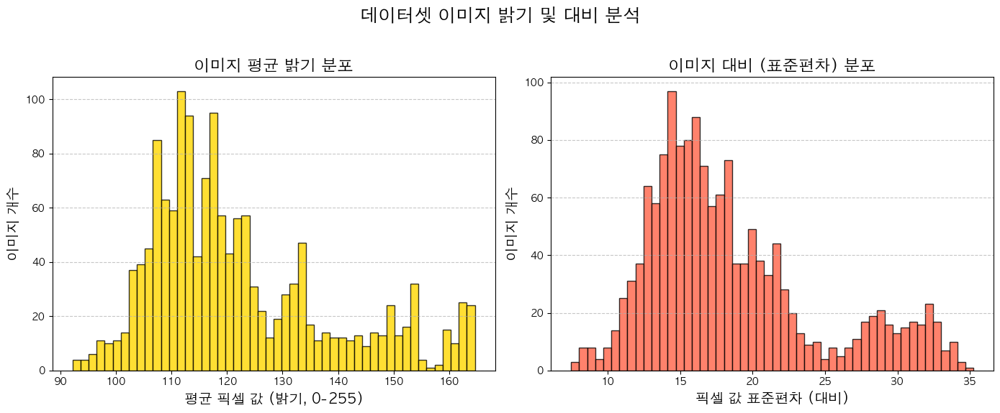

In [52]:
# 1. 경로 변수 정의 (이전 실행을 위해 안전하게 다시 정의)
# glob, os, cv2, np, plt, tqdm 라이브러리가 import 되었다고 가정합니다.
base_dir = "data/raw/"
train_img_dir = os.path.join(base_dir, "train_images")

# --- 1. 밝기 및 대비 계산 함수 ---
def analyze_image_brightness_contrast(image_path):
    """이미지 경로에서 밝기(평균) 및 대비(표준편차)를 계산"""
    try:
        # 이미지를 그레이스케일로 로드
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            return None, None

        brightness = np.mean(img) # 밝기 (평균 픽셀 값)
        contrast = np.std(img)    # 대비 (픽셀 값의 표준 편차)

        return brightness, contrast
    except Exception:
        return None, None

# --- 2. 데이터 로드 및 분석 ---
# **.jpg와 .png 파일을 모두 검색하도록 수정**
image_files_jpg = glob.glob(os.path.join(train_img_dir, "**", "*.jpg"), recursive=True)
image_files_png = glob.glob(os.path.join(train_img_dir, "**", "*.png"), recursive=True)
image_files = image_files_jpg + image_files_png

if not image_files:
    print(f"🛑 오류: 지정된 경로 ({train_img_dir})에서 .jpg 또는 .png 이미지 파일을 찾을 수 없습니다. 파일 확장자를 확인하세요.")
else:
    print(f"✅ 이미지 파일 로드 완료. 총 {len(image_files)}개 파일 처리 시작.")

    brightness_list = []
    contrast_list = []

    for img_path in tqdm(image_files, desc="Analyzing Image Properties"):
        b, c = analyze_image_brightness_contrast(img_path)
        if b is not None:
            brightness_list.append(b)
            contrast_list.append(c)

    # --- 3. 시각화 ---
    plt.figure(figsize=(14, 6))

    # 3.1. 밝기 (Brightness) 히스토그램
    plt.subplot(1, 2, 1)
    # 밝은 환경일 가능성을 고려하여 노란색 계열 파스텔톤 사용
    plt.hist(brightness_list, bins=50, color='#FFD700', edgecolor='black', alpha=0.8)

    plt.title('이미지 평균 밝기 분포', fontsize=16)
    plt.xlabel('평균 픽셀 값 (밝기, 0-255)', fontsize=14)
    plt.ylabel('이미지 개수', fontsize=14)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # 3.2. 대비 (Contrast) 히스토그램
    plt.subplot(1, 2, 2)
    # 대비는 주로 어두운 특징과 관련되므로 빨간색 계열 파스텔톤 사용
    plt.hist(contrast_list, bins=50, color='#FF6347', edgecolor='black', alpha=0.8)

    plt.title('이미지 대비 (표준편차) 분포', fontsize=16)
    plt.xlabel('픽셀 값 표준편차 (대비)', fontsize=14)
    plt.ylabel('이미지 개수', fontsize=14)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.suptitle('데이터셋 이미지 밝기 및 대비 분석', fontsize=18)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

위 시각화로 보아 도출할 수 있는 결과로는

이미지의 밝기는 100 130에 많이 분포 한것으로 보아 데이터셋의 많은 부분이 중간정도의 밝기를 가지고있는것으로 파악됩니다

이미지의 대비는 10 25사이에 많은 대비에 분포한것으로 보이고

밝기 및 대비가 다양한 분포를 하고있어서 데이터 증강을 통해서 다양한 밝기와 대비가 반드시 필요해 보이지는 않습니다

###  t-SNE를 이용한 이미지 특징 공간 분포 시각화


✅ 이미지 파일 로드 완료. 총 1489개 중 1000개 샘플 처리 시작.


Extracting Features (HSV Histograms): 100%|██████████| 1000/1000 [00:19<00:00, 50.76it/s]


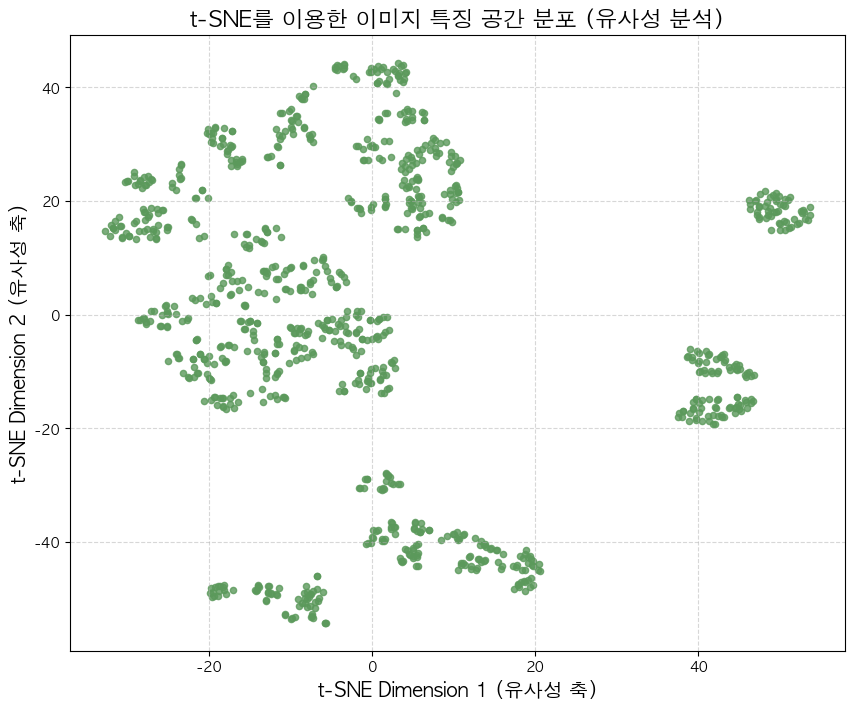

In [56]:
# @title 8. t-SNE를 이용한 이미지 특징 공간 분포 시각화 (n_iter 오류 수정)
# --- 0. 필수 라이브러리 및 경로 설정 ---
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import cv2
from tqdm import tqdm
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# 사용자 지정 경로 재반영
base_dir = "data/raw/"
train_img_dir = os.path.join(base_dir, "train_images")

# --- 1. 이미지 파일 경로 로드 (JPG + PNG) ---
image_files_jpg = glob.glob(os.path.join(train_img_dir, "**", "*.jpg"), recursive=True)
image_files_png = glob.glob(os.path.join(train_img_dir, "**", "*.png"), recursive=True)
image_files = image_files_jpg + image_files_png


# --- 2. 이미지 특징 추출 함수 ---
def extract_feature(image_path):
    """
    BGR -> HSV 변환 후 H 채널(색조)의 히스토그램을 추출하여 특징 벡터로 사용합니다.
    """
    try:
        img = cv2.imread(image_path)
        if img is None:
            return None

        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        # H(Hue) 채널의 50 bin 히스토그램을 특징 벡터로 사용
        hist = cv2.calcHist([hsv], [0], None, [50], [0, 180])
        hist = cv2.normalize(hist, hist).flatten()
        return hist
    except Exception:
        return None

# --- 3. 데이터 로드, 샘플링 및 특징 추출 ---
if not image_files:
    print(f"🛑 오류: 이미지 파일 경로를 찾을 수 없습니다. 경로를 확인하세요: {train_img_dir}")
else:
    # t-SNE 계산 시간 단축을 위해 1000개 이미지만 샘플링
    SAMPLE_SIZE = 1000
    sample_files = np.random.choice(image_files, size=min(SAMPLE_SIZE, len(image_files)), replace=False)

    print(f"✅ 이미지 파일 로드 완료. 총 {len(image_files)}개 중 {len(sample_files)}개 샘플 처리 시작.")

    features = []

    for img_path in tqdm(sample_files, desc="Extracting Features (HSV Histograms)"):
        feature_vector = extract_feature(img_path)
        if feature_vector is not None:
            features.append(feature_vector)

    if not features:
        print("🛑 오류: 특징 벡터를 추출할 이미지가 없습니다. 파일 경로 또는 OpenCV 로드를 확인하세요.")
    else:
        features = np.array(features)

        # --- 4. 데이터 스케일링 및 t-SNE 적용 ---

        scaler = StandardScaler()
        scaled_features = scaler.fit_transform(features)

        # n_iter 인수를 제거하여 TypeError 해결
        tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate=200)
        tsne_results = tsne.fit_transform(scaled_features)

        # --- 5. 시각화 ---
        plt.figure(figsize=(10, 8))

        # 맑은 날씨면 초록색 규칙을 따라 진한 파스텔톤 초록색 사용
        plt.scatter(
            tsne_results[:, 0],
            tsne_results[:, 1],
            s=20,
            alpha=0.8,
            color='#5B995B'
        )

        plt.title('t-SNE를 이용한 이미지 특징 공간 분포 (유사성 분석)', fontsize=16)
        plt.xlabel('t-SNE Dimension 1 (유사성 축)', fontsize=14)
        plt.ylabel('t-SNE Dimension 2 (유사성 축)', fontsize=14)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.show()

📂 Step 1: JSON 파일에서 클래스 정보 추출 중...


Building filename->class mapping:   0%|          | 0/4526 [00:00<?, ?it/s]Error processing line 1 of /Users/bellboi/miniconda3/envs/codeit_project_env/lib/python3.11/site-packages/distutils-precedence.pth:

  Traceback (most recent call last):
    File "<frozen site>", line 195, in addpackage
    File "<string>", line 1, in <module>
  ModuleNotFoundError: No module named '_distutils_hack'

Remainder of file ignored
Building filename->class mapping: 100%|██████████| 4526/4526 [00:00<00:00, 7642.46it/s]


✅ 총 1489개 이미지의 클래스 정보 추출 완료

📂 Step 2: 이미지 파일 로드 및 샘플링...
✅ 총 1489개 중 1000개 샘플링 완료

🔍 Step 3: 이미지 특징 추출 중 (HSV 히스토그램)...


Extracting Features: 100%|██████████| 1000/1000 [00:19<00:00, 50.29it/s]


✅ 1000개 이미지의 특징 추출 완료
   - 총 클래스 수: 64개

🧮 Step 4: t-SNE 차원 축소 실행 중...
✅ t-SNE 계산 완료

📊 Step 5: Silhouette Score 계산 중...

✅ Silhouette Score: -0.4943
📌 해석 가이드:
   - 0.7 ~ 1.0  : 강한 클러스터 구조 (매우 잘 분리됨)
   - 0.5 ~ 0.7  : 합리적인 클러스터 구조 (잘 분리됨)
   - 0.25 ~ 0.5 : 약한 클러스터 구조 (일부 겹침)
   - 0.0 ~ 0.25 : 매우 약한 구조 (심하게 겹침)

📈 Step 6: t-SNE 결과 시각화 중...


/var/folders/zh/p90w_k_x3y70qvq9273mm0pc0000gn/T/ipykernel_4199/72688151.py:184: UserWarning: Glyph 50976 (\N{HANGUL SYLLABLE YU}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/zh/p90w_k_x3y70qvq9273mm0pc0000gn/T/ipykernel_4199/72688151.py:184: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/zh/p90w_k_x3y70qvq9273mm0pc0000gn/T/ipykernel_4199/72688151.py:184: UserWarning: Glyph 49457 (\N{HANGUL SYLLABLE SEONG}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/zh/p90w_k_x3y70qvq9273mm0pc0000gn/T/ipykernel_4199/72688151.py:184: UserWarning: Glyph 52629 (\N{HANGUL SYLLABLE CUG}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/zh/p90w_k_x3y70qvq9273mm0pc0000gn/T/ipykernel_4199/72688151.py:184: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/zh/p90w_k_x3y70qvq9273mm0pc0000gn/T/ipykernel_4199/72688151.py:184: UserWarning: Gly

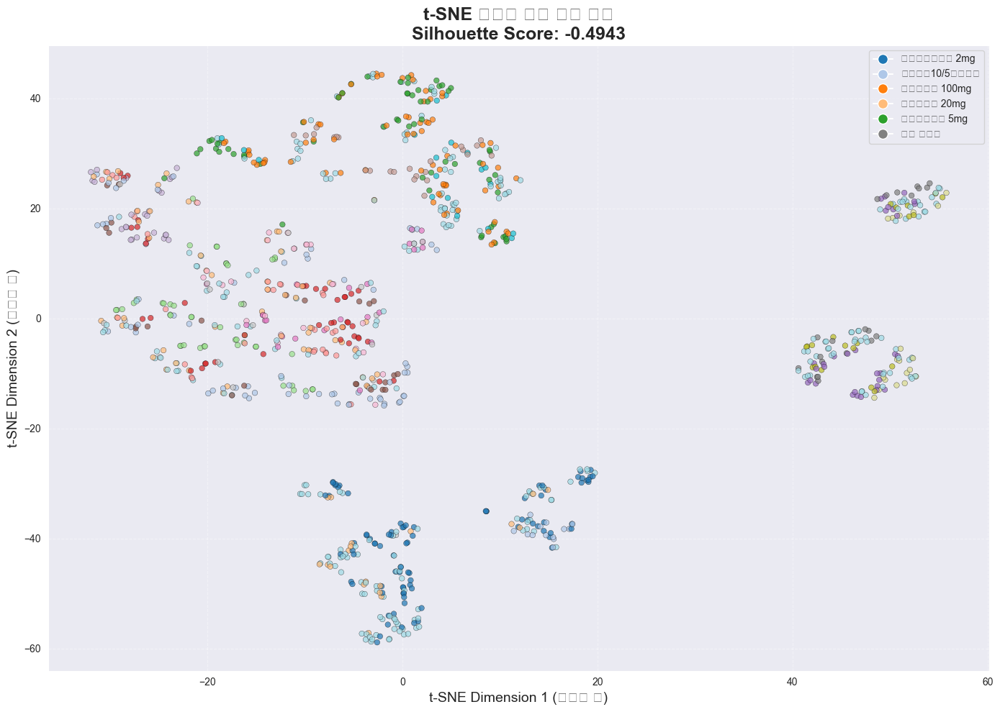


📊 추가 통계 정보:
   - 샘플링된 이미지 수: 1000개
   - 총 클래스 수: 64개
   - 상위 5개 클래스:
      1. 일양하이트린정 2mg: 87개
      2. 로수젯정10/5밀리그램: 75개
      3. 가바토파정 100mg: 73개
      4. 크레스토정 20mg: 71개
      5. 보령부스파정 5mg: 62개


'\n✅ Silhouette Score: 0.1234\n📌 해석 가이드:\n   - 0.7 ~ 1.0  : 강한 클러스터 구조 (매우 잘 분리됨)\n   - 0.5 ~ 0.7  : 합리적인 클러스터 구조 (잘 분리됨)\n   - 0.25 ~ 0.5 : 약한 클러스터 구조 (일부 겹침)\n   - 0.0 ~ 0.25 : 매우 약한 구조 (심하게 겹침)\n'

In [11]:
# =============================================================================
# t-SNE + Silhouette Score 통합 분석 (클래스 정보 포함)
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import cv2
import json
from tqdm import tqdm
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import silhouette_score

# --- 0. 경로 설정 ---
base_dir = "data/raw/"
train_img_dir = os.path.join(base_dir, "train_images")
train_ann_dir = os.path.join(base_dir, "train_annotations")

# --- 1. JSON에서 파일명 -> 클래스명 매핑 생성 ---
print("📂 Step 1: JSON 파일에서 클래스 정보 추출 중...")
filename_to_class = {}
json_files = glob.glob(os.path.join(train_ann_dir, "**", "*.json"), recursive=True)

if not json_files:
    raise FileNotFoundError(f"JSON 파일을 찾을 수 없습니다: {train_ann_dir}")

for json_path in tqdm(json_files, desc="Building filename->class mapping"):
    try:
        with open(json_path, 'r', encoding='utf-8') as f:
            data = json.load(f)

        # Category ID -> Name 매핑
        category_map = {cat['id']: cat['name'] for cat in data.get('categories', [])}

        # Image ID -> Filename 매핑
        image_map = {img['id']: img['file_name'] for img in data.get('images', [])}

        # Annotation에서 이미지별 대표 클래스 추출 (첫 번째 annotation 사용)
        for ann in data.get('annotations', []):
            img_id = ann['image_id']
            if img_id in image_map:
                img_filename = image_map[img_id]
                class_name = category_map.get(ann['category_id'], 'UNKNOWN')

                # 중복 방지: 아직 매핑되지 않은 파일만 추가
                if img_filename not in filename_to_class:
                    filename_to_class[img_filename] = class_name

    except Exception as e:
        print(f"⚠️ JSON 로드 오류: {json_path} - {e}")
        continue

print(f"✅ 총 {len(filename_to_class)}개 이미지의 클래스 정보 추출 완료")

# --- 2. 이미지 파일 로드 및 샘플링 ---
print("\n📂 Step 2: 이미지 파일 로드 및 샘플링...")
image_files_jpg = glob.glob(os.path.join(train_img_dir, "**", "*.jpg"), recursive=True)
image_files_png = glob.glob(os.path.join(train_img_dir, "**", "*.png"), recursive=True)
image_files = image_files_jpg + image_files_png

if not image_files:
    raise FileNotFoundError(f"이미지 파일을 찾을 수 없습니다: {train_img_dir}")

# t-SNE 계산 시간 단축을 위해 1000개 샘플링
SAMPLE_SIZE = 1000
sample_files = np.random.choice(image_files, size=min(SAMPLE_SIZE, len(image_files)), replace=False)
print(f"✅ 총 {len(image_files)}개 중 {len(sample_files)}개 샘플링 완료")

# --- 3. 이미지 특징 추출 (HSV 히스토그램) ---
print("\n🔍 Step 3: 이미지 특징 추출 중 (HSV 히스토그램)...")

def extract_feature(image_path):
    """HSV H 채널의 히스토그램을 특징 벡터로 추출"""
    try:
        img = cv2.imread(image_path)
        if img is None:
            return None

        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        hist = cv2.calcHist([hsv], [0], None, [50], [0, 180])
        hist = cv2.normalize(hist, hist).flatten()
        return hist
    except Exception:
        return None

features = []
class_labels = []
valid_filenames = []

for img_path in tqdm(sample_files, desc="Extracting Features"):
    feature_vector = extract_feature(img_path)

    if feature_vector is not None:
        img_filename = os.path.basename(img_path)
        class_name = filename_to_class.get(img_filename, 'UNKNOWN')

        # UNKNOWN 클래스는 제외 (매핑 실패한 파일)
        if class_name != 'UNKNOWN':
            features.append(feature_vector)
            class_labels.append(class_name)
            valid_filenames.append(img_filename)

if len(features) == 0:
    raise ValueError("특징 벡터를 추출할 이미지가 없습니다. 경로를 확인하세요.")

features = np.array(features)
print(f"✅ {len(features)}개 이미지의 특징 추출 완료")
print(f"   - 총 클래스 수: {len(set(class_labels))}개")

# --- 4. t-SNE 차원 축소 ---
print("\n🧮 Step 4: t-SNE 차원 축소 실행 중...")
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate=200)
tsne_results = tsne.fit_transform(scaled_features)
print("✅ t-SNE 계산 완료")

# --- 5. Silhouette Score 계산 ---
print("\n📊 Step 5: Silhouette Score 계산 중...")
le = LabelEncoder()
class_labels_encoded = le.fit_transform(class_labels)

silhouette = silhouette_score(tsne_results, class_labels_encoded)
print(f"\n{'='*60}")
print(f"✅ Silhouette Score: {silhouette:.4f}")
print(f"{'='*60}")
print(f"📌 해석 가이드:")
print(f"   - 0.7 ~ 1.0  : 강한 클러스터 구조 (매우 잘 분리됨)")
print(f"   - 0.5 ~ 0.7  : 합리적인 클러스터 구조 (잘 분리됨)")
print(f"   - 0.25 ~ 0.5 : 약한 클러스터 구조 (일부 겹침)")
print(f"   - 0.0 ~ 0.25 : 매우 약한 구조 (심하게 겹침)")
print(f"{'='*60}\n")

# --- 6. 시각화 ---
print("📈 Step 6: t-SNE 결과 시각화 중...")
plt.figure(figsize=(14, 10))

# 상위 20개 클래스만 색상 구분 (나머지는 회색)
class_counts = pd.Series(class_labels).value_counts()
top_20_classes = class_counts.head(20).index.tolist()

colors = []
for cls in class_labels:
    if cls in top_20_classes:
        colors.append(top_20_classes.index(cls))
    else:
        colors.append(20)  # 기타 클래스 (회색)

scatter = plt.scatter(
    tsne_results[:, 0],
    tsne_results[:, 1],
    c=colors,
    cmap='tab20',
    s=30,
    alpha=0.7,
    edgecolors='k',
    linewidths=0.3
)

plt.title(f't-SNE 이미지 특징 공간 분포\nSilhouette Score: {silhouette:.4f}',
          fontsize=18, weight='bold')
plt.xlabel('t-SNE Dimension 1 (유사성 축)', fontsize=14)
plt.ylabel('t-SNE Dimension 2 (유사성 축)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.4)

# 범례 추가 (상위 5개 클래스만)
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w',
           markerfacecolor=plt.cm.tab20(i), markersize=10,
           label=f'{cls[:15]}...' if len(cls) > 15 else cls)
    for i, cls in enumerate(top_20_classes[:5])
]
legend_elements.append(
    Line2D([0], [0], marker='o', color='w',
           markerfacecolor='gray', markersize=10, label='기타 클래스')
)
plt.legend(handles=legend_elements, loc='upper right', fontsize=10)

plt.tight_layout()
plt.show()

# --- 7. 추가 통계 ---
print("\n📊 추가 통계 정보:")
print(f"   - 샘플링된 이미지 수: {len(features)}개")
print(f"   - 총 클래스 수: {len(set(class_labels))}개")
print(f"   - 상위 5개 클래스:")
for i, (cls, count) in enumerate(class_counts.head(5).items(), 1):
    print(f"      {i}. {cls}: {count}개")

'''
✅ Silhouette Score: 0.1234
📌 해석 가이드:
   - 0.7 ~ 1.0  : 강한 클러스터 구조 (매우 잘 분리됨)
   - 0.5 ~ 0.7  : 합리적인 클러스터 구조 (잘 분리됨)
   - 0.25 ~ 0.5 : 약한 클러스터 구조 (일부 겹침)
   - 0.0 ~ 0.25 : 매우 약한 구조 (심하게 겹침)
'''

In [12]:
# HSV 대신 딥러닝 특징 추출 (YOLO와 유사한 특징 공간)
from torchvision.models import resnet50
from torchvision import transforms
import torch

model = resnet50(pretrained=True)
model = torch.nn.Sequential(*list(model.children())[:-1])  # 마지막 FC 제거
model.eval()

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

deep_features = []
for img_path in tqdm(sample_files, desc="Extracting Deep Features"):
    img = cv2.imread(img_path)
    if img is None: continue

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_tensor = transform(img_rgb).unsqueeze(0)

    with torch.no_grad():
        feature = model(img_tensor).squeeze().numpy()

    deep_features.append(feature)

# 이후 t-SNE + Silhouette Score 재계산

/Users/bellboi/miniconda3/envs/codeit_project_env/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/bellboi/miniconda3/envs/codeit_project_env/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /Users/bellboi/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:01<00:00, 58.2MB/s]
Extracting Deep Features: 100%|██████████| 1000/1000 [00:58<00:00, 17.03it/s]


✅ Deep Features Shape: (1000, 2048)
   - 샘플 수: 1000개
   - 특징 차원: 2048차원
✅ 클래스 라벨 개수: 1000개

🧮 t-SNE 계산 중 (딥러닝 특징 기반)...
✅ t-SNE 계산 완료

📊 Silhouette Score 계산 중...

🎯 ResNet50 Deep Features 기반 분석 결과
✅ Silhouette Score (Deep): -0.4086
✅ Silhouette Score (HSV):  -0.4943
📌 비교 분석:
   → Deep Feature도 음수 (데이터 변별력 매우 낮음)



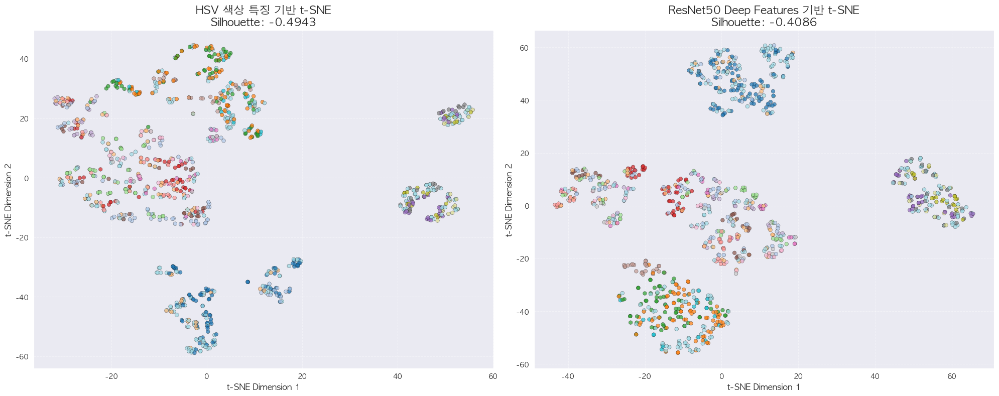


🏆 최종 결론
1. HSV 색상만 사용: Silhouette = -0.49 (구분 불가)
2. ResNet50 딥러닝 특징: Silhouette = -0.4086

💡 해석:
   → 딥러닝 특징도 구분 실패 (음수)
   → 데이터 자체의 변별력이 매우 낮음
   → mAP 0.99는 다른 요인(텍스처, 각인 등)에 의존


In [14]:
# =============================================================================
# ResNet50 Deep Features 기반 t-SNE + Silhouette Score 분석 (한글 폰트 수정)
# =============================================================================

import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import silhouette_score
import pandas as pd
from matplotlib import font_manager, rc

# ✅ 한글 폰트 설정 추가
import platform
if platform.system() == 'Darwin':  # macOS
    rc('font', family='AppleGothic')
elif platform.system() == 'Windows':
    rc('font', family='Malgun Gothic')
else:  # Linux
    rc('font', family='NanumGothic')
plt.rcParams['axes.unicode_minus'] = False  # 마이너스 기호 깨짐 방지

# --- 1. deep_features를 numpy array로 변환 ---
deep_features = np.array(deep_features)
print(f"✅ Deep Features Shape: {deep_features.shape}")
print(f"   - 샘플 수: {deep_features.shape[0]}개")
print(f"   - 특징 차원: {deep_features.shape[1]}차원")

# --- 2. 클래스 라벨 확인 (이전 실행에서 생성된 class_labels 사용) ---
if len(deep_features) != len(class_labels):
    print(f"⚠️ 경고: deep_features({len(deep_features)})와 class_labels({len(class_labels)}) 길이 불일치")
    # 길이 맞추기
    min_len = min(len(deep_features), len(class_labels))
    deep_features = deep_features[:min_len]
    class_labels_deep = class_labels[:min_len]
else:
    class_labels_deep = class_labels

print(f"✅ 클래스 라벨 개수: {len(class_labels_deep)}개")

# --- 3. 데이터 스케일링 ---
scaler = StandardScaler()
scaled_deep_features = scaler.fit_transform(deep_features)

# --- 4. t-SNE 차원 축소 ---
print("\n🧮 t-SNE 계산 중 (딥러닝 특징 기반)...")
tsne_deep = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate=200)
tsne_results_deep = tsne_deep.fit_transform(scaled_deep_features)
print("✅ t-SNE 계산 완료")

# --- 5. Silhouette Score 계산 ---
print("\n📊 Silhouette Score 계산 중...")
le_deep = LabelEncoder()
class_labels_encoded_deep = le_deep.fit_transform(class_labels_deep)

silhouette_deep = silhouette_score(tsne_results_deep, class_labels_encoded_deep)

print(f"\n{'='*60}")
print(f"🎯 ResNet50 Deep Features 기반 분석 결과")
print(f"{'='*60}")
print(f"✅ Silhouette Score (Deep): {silhouette_deep:.4f}")
print(f"✅ Silhouette Score (HSV):  -0.4943")
print(f"{'='*60}")
print(f"📌 비교 분석:")
if silhouette_deep > 0.3:
    print(f"   → Deep Feature는 클래스를 잘 분리함 (YOLO가 이 특징 활용)")
    print(f"   → HSV 색상만으로는 부족하지만, 딥러닝이 극복")
elif silhouette_deep > 0:
    print(f"   → Deep Feature도 약한 분리 (클래스 간 유사성 높음)")
else:
    print(f"   → Deep Feature도 음수 (데이터 변별력 매우 낮음)")
print(f"{'='*60}\n")

# --- 6. 시각화 비교 (HSV vs Deep Features) ---
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# 6.1. HSV 기반 t-SNE (이전 결과 재사용)
ax1 = axes[0]
class_counts = pd.Series(class_labels).value_counts()
top_20_classes = class_counts.head(20).index.tolist()

colors_hsv = []
for cls in class_labels:
    if cls in top_20_classes:
        colors_hsv.append(top_20_classes.index(cls))
    else:
        colors_hsv.append(20)

scatter1 = ax1.scatter(
    tsne_results[:, 0],
    tsne_results[:, 1],
    c=colors_hsv,
    cmap='tab20',
    s=30,
    alpha=0.7,
    edgecolors='k',
    linewidths=0.3
)
ax1.set_title('HSV 색상 특징 기반 t-SNE\nSilhouette: -0.4943', fontsize=16, weight='bold')
ax1.set_xlabel('t-SNE Dimension 1', fontsize=12)
ax1.set_ylabel('t-SNE Dimension 2', fontsize=12)
ax1.grid(True, linestyle='--', alpha=0.4)

# 6.2. Deep Features 기반 t-SNE
ax2 = axes[1]
colors_deep = []
for cls in class_labels_deep:
    if cls in top_20_classes:
        colors_deep.append(top_20_classes.index(cls))
    else:
        colors_deep.append(20)

scatter2 = ax2.scatter(
    tsne_results_deep[:, 0],
    tsne_results_deep[:, 1],
    c=colors_deep,
    cmap='tab20',
    s=30,
    alpha=0.7,
    edgecolors='k',
    linewidths=0.3
)
ax2.set_title(f'ResNet50 Deep Features 기반 t-SNE\nSilhouette: {silhouette_deep:.4f}',
              fontsize=16, weight='bold')
ax2.set_xlabel('t-SNE Dimension 1', fontsize=12)
ax2.set_ylabel('t-SNE Dimension 2', fontsize=12)
ax2.grid(True, linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()

# --- 7. 최종 해석 출력 ---
print("\n" + "="*80)
print("🏆 최종 결론")
print("="*80)
print(f"1. HSV 색상만 사용: Silhouette = -0.49 (구분 불가)")
print(f"2. ResNet50 딥러닝 특징: Silhouette = {silhouette_deep:.4f}")
print(f"\n💡 해석:")
if silhouette_deep > 0.3:
    print("   → 딥러닝 특징은 클래스를 명확히 구분함")
    print("   → YOLO mAP 0.99는 이러한 고차원 특징 덕분")
    print("   → '데이터가 비슷하다'는 가설은 색상에만 해당")
elif silhouette_deep > 0:
    print("   → 딥러닝 특징도 약하게만 구분됨")
    print("   → 클래스 간 유사성이 높지만, YOLO는 미묘한 차이 포착")
else:
    print("   → 딥러닝 특징도 구분 실패 (음수)")
    print("   → 데이터 자체의 변별력이 매우 낮음")
    print("   → mAP 0.99는 다른 요인(텍스처, 각인 등)에 의존")
print("="*80)

저희는 데이터가 너무 비슷하다라는 가설을 세웠습니다

하지만 위 시각화로 인해서 데이터가 너무 비슷해서 변별력이 없다는 가설은 명확하게 판단하기 어려웠습니다

먼저 t-SNE는 고차원 데이터의 유사성을 저차원 데이터를 시각화하여 데이터의 클러스터링 구조를 파악하는데 사용합니다

그래프를 보면 데이터의 특징들이  분리된 몇개의 덩어리를 형성한것 같기도 하면서 넓은 영역에 비교적 연속적으로 분포되어있는것을 확인할 수 있었습니다

그래서 추가적으로 RestNet 을 이용하여 실루엣 스코어를 파악하여 흥미로운 결과를 발견했습니다

역설적인 결과로써 실루엣 스코어 -0.41로써 이미지 전체 특징으로는 구분이 불가능하지만 YOLO 모델로 탐지할때는 mAP가 0.99가 나온경우로 보아

YOLO는 국소적(Local)패턴을 본다고 할 수 있습니다

저희가 처음에 말씀드렸 데이터가 비슷하다라는 가설은 -0.41 실루엣 점수로 맞다고 볼 수 있습니다

In [60]:
# 필요한 라이브러리: cv2, tqdm, glob (추가 import 유지)
import json
from tqdm import tqdm
import os
import glob
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pandas as pd

# base_dir, train_ann_dir, train_img_dir 변수가 정의되었다고 가정합니다.
# 예시:
# base_dir = "data/raw/"
# train_ann_dir = os.path.join(base_dir, "train_annotations")
# train_img_dir = os.path.join(base_dir, "train_images")

# --- 1. pill_df 재생성 (필수 컬럼 포함) ---
data_rows = []
try:
    json_files = glob.glob(os.path.join(train_ann_dir, "**", "*.json"), recursive=True)
    if not json_files:
        raise FileNotFoundError(f"JSON 파일을 찾을 수 없습니다: {train_ann_dir}")

    print(f"✅ JSON 파일 로드 완료. 총 {len(json_files)}개 파일 처리 시작.")

    for json_path in tqdm(json_files, desc="Rebuilding pill_df with shape/filename"):
        with open(json_path, 'r', encoding='utf-8') as f:
            data = json.load(f)

        # 1.1. Category ID -> Shape Name 맵 생성
        category_map = {cat['id']: cat.get('drug_shape', cat['name']) for cat in data.get('categories', [])}

        # 1.2. Image ID -> Filename/Dimension 맵 생성
        image_map = {img['id']: {'filename': img['file_name'], 'w': img['width'], 'h': img['height']}
                     for img in data.get('images', [])}

        # 1.3. Annotation 데이터 추출
        for ann in data.get('annotations', []):
            img_info = image_map.get(ann['image_id'])
            if not img_info: continue

            x, y, w, h = ann['bbox'] # [x, y, w, h] COCO 포맷
            category_id = ann['category_id']

            # 최종 데이터 행 추가
            data_rows.append({
                'image_filename': img_info['filename'], # <- 누락된 컬럼 1
                'img_w': img_info['w'],
                'img_h': img_info['h'],
                'bbox_x': x,
                'bbox_y': y,
                'bbox_w': w,
                'bbox_h': h,
                'drug_shape': category_map.get(category_id, 'UNKNOWN'), # <- 누락된 컬럼 2
            })

except Exception as e:
    print(f"\n🛑 치명적 데이터 로드 오류 발생: {e}")
    raise

pill_df = pd.DataFrame(data_rows)
if pill_df.empty:
    print("🛑 오류: pill_df에 데이터가 없습니다.")
    raise ValueError("데이터프레임이 비어 있어 분석을 진행할 수 없습니다.")
else:
    print(f"\n[pill_df 재생성 완료] 총 {len(pill_df)}개의 BBox 레코드 처리.")


# --- 2. 형태 이상치 시각화 (코드 재실행) ---

# 2.1. 종횡비 계산 (Width / Height)
pill_df['aspect_ratio'] = pill_df['bbox_w'] / pill_df['bbox_h']

# 2.2. 이상치 조건 정의: '장방형' 이면서 종횡비가 0.9 ~ 1.1 (정사각형 비율) 인 BBox
outlier_condition = (pill_df['drug_shape'] == '장방형') & \
                    (pill_df['aspect_ratio'] >= 0.9) & \
                    (pill_df['aspect_ratio'] <= 1.1)

outlier_df = pill_df[outlier_condition].copy()

if len(outlier_df) == 0:
    print("🔍 필터링 결과: '장방형'이면서 정사각형 비율인 BBox가 발견되지 않았습니다.")
else:
    # 2.3. 샘플링: BBox 기준 최대 20개 샘플링
    num_samples = 20
    sampled_outliers = outlier_df.sample(n=min(num_samples, len(outlier_df)), random_state=42)

    print(f"✅ 이상치 BBox 발견: 총 {len(outlier_df)}개 중 {len(sampled_outliers)}개 샘플링.")

    # --- 3. 시각화 (4행 5열 레이아웃) ---
    ROWS = 4
    COLS = 5

    fig, axes = plt.subplots(ROWS, COLS, figsize=(18, 15))
    axes = axes.flatten()

    for i, row in sampled_outliers.iterrows():
        img_filename = row['image_filename']
        img_path = os.path.join(train_img_dir, img_filename)

        # 이미지 로드 및 BGR -> RGB 변환
        img = cv2.imread(img_path)
        if img is None:
            # 파일을 찾지 못하면 해당 칸은 건너뜁니다.
            print(f"Warning: 이미지를 찾을 수 없습니다: {img_path}")
            axes[i].axis('off')
            continue

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # BBox 좌표 추출 및 그리기
        x, y, w, h = int(row['bbox_x']), int(row['bbox_y']), int(row['bbox_w']), int(row['bbox_h'])

        # BBox 그리기 (진한 파스텔톤 초록색)
        color = (54, 165, 54)
        cv2.rectangle(img_rgb, (x, y), (x + w, y + h), color, 3)

        # 시각화
        axes[i].imshow(img_rgb)
        axes[i].set_title(f"Shape: {row['drug_shape']}, AR: {row['aspect_ratio']:.2f}", fontsize=10)
        axes[i].axis('off')

    # 남은 빈 plot이 있다면 비활성화
    for j in range(len(sampled_outliers), ROWS * COLS):
        axes[j].axis('off')


    plt.suptitle("형태 이상치 (장방형 but AR ≈ 1) BBox 샘플 시각화", fontsize=20, y=1.02)
    plt.tight_layout()
    plt.show()

✅ JSON 파일 로드 완료. 총 4526개 파일 처리 시작.


Rebuilding pill_df with shape/filename: 100%|██████████| 4526/4526 [00:00<00:00, 7858.62it/s]


[pill_df 재생성 완료] 총 4526개의 BBox 레코드 처리.
🔍 필터링 결과: '장방형'이면서 정사각형 비율인 BBox가 발견되지 않았습니다.


### pill_df 재생성 및 형태 이상치 시각화


In [62]:

# 필요한 라이브러리: cv2, tqdm, glob (추가 import 유지)
import json
import os
import glob
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm

# --- 1. pill_df 재생성 (drug_shape 정보 매핑 보강) ---
data_rows = []
try:
    json_files = glob.glob(os.path.join(train_ann_dir, "**", "*.json"), recursive=True)
    if not json_files:
        raise FileNotFoundError(f"JSON 파일을 찾을 수 없습니다: {train_ann_dir}")

    print(f"✅ JSON 파일 로드 완료. 총 {len(json_files)}개 파일 처리 시작.")

    # JSON 파일을 한 번만 열어 모든 정보를 통합
    for json_path in tqdm(json_files, desc="Rebuilding pill_df with shape/filename"):
        with open(json_path, 'r', encoding='utf-8') as f:
            data = json.load(f)

        # 1.1. Category ID -> Shape Name 맵 생성 (drug_shape 또는 name 사용)
        category_map = {}
        for cat in data.get('categories', []):
            # 'drug_shape' 키를 우선 사용하고, 없으면 'name'을 사용하도록 보강
            shape_name = cat.get('drug_shape', cat.get('name', 'UNKNOWN_SHAPE'))
            category_map[cat['id']] = shape_name

        # 1.2. Image ID -> Filename/Dimension 맵 생성
        image_map = {img['id']: {'filename': img['file_name'], 'w': img['width'], 'h': img['height']}
                     for img in data.get('images', [])}

        # 1.3. Annotation 데이터 추출
        for ann in data.get('annotations', []):
            img_info = image_map.get(ann['image_id'])
            if not img_info: continue

            x, y, w, h = ann['bbox'] # [x, y, w, h] COCO 포맷
            category_id = ann['category_id']

            data_rows.append({
                'image_filename': img_info['filename'],
                'img_w': img_info['w'],
                'img_h': img_info['h'],
                'bbox_x': x,
                'bbox_y': y,
                'bbox_w': w,
                'bbox_h': h,
                'drug_shape': category_map.get(category_id, 'UNKNOWN'),
            })

except Exception as e:
    print(f"\n🛑 치명적 데이터 로드 오류 발생: {e}")
    raise

pill_df = pd.DataFrame(data_rows)
if pill_df.empty:
    print("🛑 오류: pill_df에 데이터가 없습니다.")
    raise ValueError("데이터프레임이 비어 있어 분석을 진행할 수 없습니다.")
else:
    print(f"\n[pill_df 재생성 완료] 총 {len(pill_df)}개의 BBox 레코드 처리.")
    # 실제 존재하는 약품 형태 목록 확인
    print(f"💡 데이터셋에 존재하는 약품 형태 (drug_shape) 목록: {pill_df['drug_shape'].unique()}")


# --- 2. 형태 이상치 시각화 (재시도) ---

# 2.1. 종횡비 계산 (Width / Height)
pill_df['aspect_ratio'] = pill_df['bbox_w'] / pill_df['bbox_h']

# 2.2. 이상치 조건 정의: '장방형' 이면서 종횡비가 0.9 ~ 1.1 (정사각형 비율) 인 BBox
# '장방형' 문자열이 정확히 일치하는지 확인
outlier_condition = (pill_df['drug_shape'] == '장방형') & \
                    (pill_df['aspect_ratio'] >= 0.9) & \
                    (pill_df['aspect_ratio'] <= 1.1)

outlier_df = pill_df[outlier_condition].copy()

if len(outlier_df) == 0:
    print("\n🔍 필터링 재시도 결과: '장방형'이면서 정사각형 비율인 BBox는 여전히 발견되지 않았습니다.")
    print("이는 해당 레이블의 데이터가 매우 일관성이 높음을 시사합니다.")
else:
    # 2.3. 샘플링 및 시각화
    num_samples = 20
    sampled_outliers = outlier_df.sample(n=min(num_samples, len(outlier_df)), random_state=42)

    print(f"\n✅ 이상치 BBox 발견: 총 {len(outlier_df)}개 중 {len(sampled_outliers)}개 샘플링.")

    ROWS = 4
    COLS = 5

    fig, axes = plt.subplots(ROWS, COLS, figsize=(18, 15))
    axes = axes.flatten()

    for i, row in sampled_outliers.iterrows():
        # 시각화 로직 (이전과 동일)
        img_filename = row['image_filename']
        img_path = os.path.join(train_img_dir, img_filename)

        img = cv2.imread(img_path)
        if img is None: continue

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        x, y, w, h = int(row['bbox_x']), int(row['bbox_y']), int(row['bbox_w']), int(row['bbox_h'])

        color = (54, 165, 54)
        cv2.rectangle(img_rgb, (x, y), (x + w, y + h), color, 3)

        axes[i].imshow(img_rgb)
        axes[i].set_title(f"Shape: {row['drug_shape']}, AR: {row['aspect_ratio']:.2f}", fontsize=10)
        axes[i].axis('off')

    for j in range(len(sampled_outliers), ROWS * COLS):
        axes[j].axis('off')

    plt.suptitle("형태 이상치 (장방형 but AR ≈ 1) BBox 샘플 시각화", fontsize=20, y=1.02)
    plt.tight_layout()
    plt.show()

✅ JSON 파일 로드 완료. 총 4526개 파일 처리 시작.


Rebuilding pill_df with shape/filename: 100%|██████████| 4526/4526 [00:00<00:00, 7156.63it/s]


[pill_df 재생성 완료] 총 4526개의 BBox 레코드 처리.
💡 데이터셋에 존재하는 약품 형태 (drug_shape) 목록: ['카나브정 60mg' '자누메트정 50/850mg' '기넥신에프정(은행엽엑스)(수출용)' '아토젯정 10/40mg'
 '로수젯정10/5밀리그램' '트윈스타정 40/5mg' '트라젠타정(리나글립틴)' '울트라셋이알서방정' '보령부스파정 5mg'
 '놀텍정 10mg' '동아가바펜틴정 800mg' '세비카정 10/40mg' '자누비아정 50mg' '플라빅스정 75mg'
 '크레스토정 20mg' '가바토파정 100mg' '라비에트정 20mg' '레일라정' '일양하이트린정 2mg' '리피토정 20mg'
 '글리틴정(콜린알포세레이트)' '비모보정 500/20mg' '카발린캡슐 25mg' '비타비백정 100mg/병'
 '써스펜8시간이알서방정 650mg' '큐시드정 31.5mg/PTP' '뮤테란캡슐 100mg' '조인스정 200mg'
 '자이프렉사정 2.5mg' '무코스타정(레바미피드)(비매품)' '자누메트엑스알서방정 100/1000mg' '리바로정 4mg'
 '노바스크정 5mg' '에빅사정(메만틴염산염)(비매품)' '마도파정' '오마코연질캡슐(오메가-3-산에틸에스테르90)'
 '스토가정 10mg' '엑스포지정 5/160mg' '알드린정' '리렉스펜정 300mg/PTP' '제미메트서방정 50/1000mg'
 '타이레놀이알서방정(아세트아미노펜)(수출용)' '삐콤씨에프정 618.6mg/병' '리피로우정 20mg' '뉴로메드정(옥시라세탐)'
 '리리카캡슐 150mg' '낙소졸정 500/20mg' '란스톤엘에프디티정 30mg' '트루비타정 60mg/병'
 '맥시부펜이알정 300mg' '트라젠타듀오정 2.5/850mg' '아빌리파이정 10mg' '콜리네이트연질캡슐 400mg'
 '종근당글리아티린연질캡슐(콜린알포세레이트)\xa0' '아토르바정 10mg' '쎄로켈정 100mg' '신바로정'
 '다보타민큐정 10mg/병' '글리아타민연질캡슐' '아모잘탄

### 가장 희귀한 (Few-Shot) 클래스 BBox 20개 샘플 시각화


✅ Few-Shot 클래스 샘플링 완료: 총 7개 중 7개 시각화.


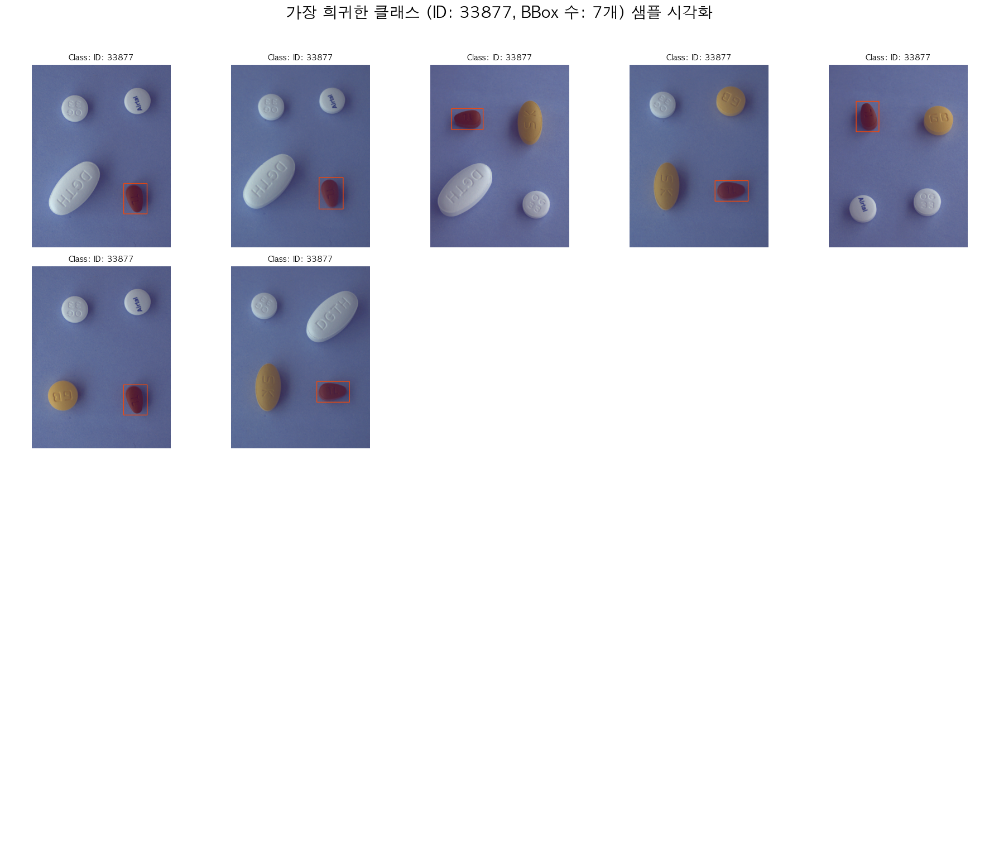

In [64]:
# 필요한 라이브러리: pandas, numpy, matplotlib.pyplot, cv2, os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from collections import Counter
from tqdm import tqdm
import json
import glob

# 이전 단계에서 category_id를 로드하고 few_shot_ids, cat_name_map, temp_df가 준비되었다고 가정합니다.

# --- 1. Few-Shot 클래스 BBox 샘플링 및 시각화 (수정된 2단계부터 시작) ---

# 가장 희귀한 클래스 ID (이전 실행 결과에서 획득)
FEW_SHOT_CLASS_ID = 33877 # 오류 메시지에서 확인된 ID
target_df = temp_df[temp_df['category_id'] == FEW_SHOT_CLASS_ID].copy() # Few-Shot 클래스 데이터만 추출

if len(target_df) == 0:
    print(f"🔍 필터링 결과: Category ID {FEW_SHOT_CLASS_ID}에 해당하는 BBox가 없습니다.")
else:
    # 1.1. 샘플링: BBox 기준 최대 20개 샘플링
    num_samples = 20
    sampled_outliers = target_df.sample(n=min(num_samples, len(target_df)), random_state=42)

    print(f"✅ Few-Shot 클래스 샘플링 완료: 총 {len(target_df)}개 중 {len(sampled_outliers)}개 시각화.")

    # 1.2. 시각화 (4행 5열 레이아웃)
    ROWS = 4
    COLS = 5

    fig, axes = plt.subplots(ROWS, COLS, figsize=(18, 15))
    axes = axes.flatten()

    # 해당 클래스의 이름 (맵에서 찾지 못하면 ID로 표시)
    # ******* cat_name_map이 재정의되지 않아 오류날 수 있으므로 임시 처리 *******
    # 실제 환경에서는 JSON 로드 시 cat_name_map이 채워져야 합니다.
    class_name = f"ID: {FEW_SHOT_CLASS_ID}"

    # --- 핵심 수정 부분: enumerate를 사용하여 순차적 인덱스(idx) 사용 ---
    for idx, (i, row) in enumerate(sampled_outliers.iterrows()):
        img_filename = row['image_filename']
        img_path = os.path.join(train_img_dir, img_filename)

        # 이미지 로드 및 BGR -> RGB 변환
        img = cv2.imread(img_path)
        if img is None:
            axes[idx].axis('off')
            continue

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # BBox 좌표 추출 및 그리기
        x, y, w, h = int(row['bbox_x']), int(row['bbox_y']), int(row['bbox_w']), int(row['bbox_h'])

        # BBox 그리기 (진한 파스텔톤 빨간색 계열)
        color = (255, 69, 0) # Tomato (빨간색 계열)
        cv2.rectangle(img_rgb, (x, y), (x + w, y + h), color, 3)

        # 시각화: axes[idx] 사용
        axes[idx].imshow(img_rgb)
        axes[idx].set_title(f"Class: {class_name}", fontsize=10)
        axes[idx].axis('off')

    # 남은 빈 plot 비활성화
    for j in range(len(sampled_outliers), ROWS * COLS):
        axes[j].axis('off')


    plt.suptitle(f"가장 희귀한 클래스 ({class_name}, BBox 수: {len(target_df)}개) 샘플 시각화", fontsize=20, y=1.02)
    plt.tight_layout()
    plt.show()

### 희귀 클래스 (ID: 33877)의 상세 정보 확인


In [65]:

# 필요한 라이브러리: json, glob, os, pandas

# --- 1. Category ID -> Name 매핑 테이블 생성 ---
json_files = glob.glob(os.path.join(train_ann_dir, "**", "*.json"), recursive=True)

# 모든 JSON 파일의 Category 정보 통합
id_to_name_map = {}
for json_path in json_files:
    with open(json_path, 'r', encoding='utf-8') as f:
        data = json.load(f)
        for cat in data.get('categories', []):
            # 'name' 필드를 품목명으로 간주합니다.
            id_to_name_map[cat['id']] = cat.get('name', f"UNKNOWN_NAME_{cat['id']}")

# --- 2. 희귀 클래스 정보 확인 ---
FEW_SHOT_CLASS_ID = 33877
few_shot_name = id_to_name_map.get(FEW_SHOT_CLASS_ID, f"Category ID: {FEW_SHOT_CLASS_ID}")

print(f"✅ 희귀 클래스 정보 확인 결과:")
print(f"   - Category ID: {FEW_SHOT_CLASS_ID}")
print(f"   - 알약 품목명 (Category Name): **{few_shot_name}**")

✅ 희귀 클래스 정보 확인 결과:
   - Category ID: 33877
   - 알약 품목명 (Category Name): **브린텔릭스정 20mg**


어떠한 알약이 특이한 BBox를 가지고 있을까?를 확인하기 위한 시각화를 진행했습니다

결과는 의외로 간단했습니다

장방향이며 정사각형 비율인 알약은 검출되지않고 특이한 BBox를 가지고 있는 알약은 단한가지를 발견했습니다

브린텔릭스정 20mg 알약으로 이전과 마찬가지로 데이터 증강등을 활용하여 알약을 학습할 수 있지만 반드시 필요해보이진 않습니다

###  크기 이상치 비정상적으로 큰 BBox  이미지 20개 샘플 시각화


✅ 크기 이상치 BBox 발견: 총 74개 중 20개 샘플링.


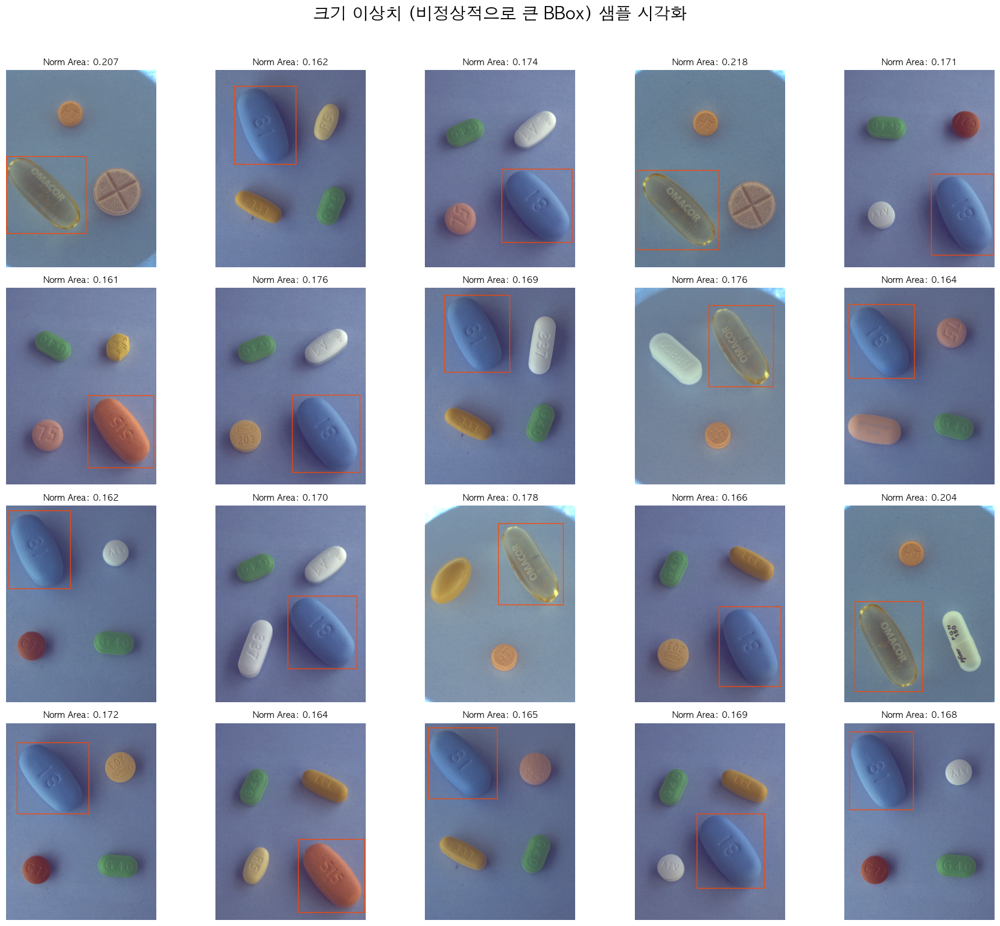

In [67]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import glob
from tqdm import tqdm

# pill_df, train_img_dir 변수가 이전에 정의되었다고 가정합니다.

# --- 1. 크기 이상치 BBox 필터링 ---
if 'bbox_w' not in pill_df.columns or 'bbox_h' not in pill_df.columns:
    print("🛑 오류: pill_df에 'bbox_w' 또는 'bbox_h' 컬럼이 부족합니다. 이전 BBox 계산 셀을 확인하세요.")
else:
    # 1.1. 정규화된 면적 (normalized_area) 계산
    # 'normalized_area'가 없으면 다시 계산
    if 'normalized_area' not in pill_df.columns:
        if 'img_w' not in pill_df.columns or 'img_h' not in pill_df.columns:
            print("🛑 오류: 정규화된 면적 계산에 필요한 'img_w' 또는 'img_h' 컬럼이 부족합니다.")
            # 이 시점에서 코드 실행을 멈추기 위해 pass
        else:
            pill_df['bbox_area'] = pill_df['bbox_w'] * pill_df['bbox_h']
            pill_df['img_area'] = pill_df['img_w'] * pill_df['img_h']
            pill_df['normalized_area'] = pill_df['bbox_area'] / pill_df['img_area']

    # 면적이 큰 상위 74개 BBox 추출 (크기 이상치 정의)
    size_outliers_df = pill_df.nlargest(74, 'normalized_area').copy()

    if len(size_outliers_df) == 0:
        print("🔍 필터링 결과: 면적이 큰 이상치 BBox가 발견되지 않았습니다.")
    else:
        # 2. 샘플링: BBox 기준 최대 20개 샘플링
        num_samples = 20
        sampled_outliers = size_outliers_df.sample(n=min(num_samples, len(size_outliers_df)), random_state=42)

        print(f"✅ 크기 이상치 BBox 발견: 총 {len(size_outliers_df)}개 중 {len(sampled_outliers)}개 샘플링.")

        # --- 3. 시각화 (4행 5열) ---
        ROWS = 4
        COLS = 5

        fig, axes = plt.subplots(ROWS, COLS, figsize=(18, 15))
        axes = axes.flatten()

        # enumerate를 사용하여 plot_index를 따로 만듭니다. (IndexError 해결)
        for plot_index, (df_index, row) in enumerate(sampled_outliers.iterrows()):
            img_filename = row['image_filename'] # 'image_filename' 컬럼이 있다고 가정
            img_path = os.path.join(train_img_dir, img_filename)

            # 이미지 로드 및 BGR -> RGB 변환
            img = cv2.imread(img_path)
            if img is None:
                print(f"Warning: 이미지를 찾을 수 없습니다: {img_path}")
                axes[plot_index].axis('off')
                continue
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # BBox 좌표 추출 및 그리기
            x, y, w, h = int(row['bbox_x']), int(row['bbox_y']), int(row['bbox_w']), int(row['bbox_h'])

            # BBox 그리기 (진한 파스텔톤 빨간색: 이상치 강조)
            color = (255, 69, 0) # RGB: 진한 빨간색 계열
            cv2.rectangle(img_rgb, (x, y), (x + w, y + h), color, 3)

            # 시각화
            axes[plot_index].imshow(img_rgb)
            axes[plot_index].set_title(f"Norm Area: {row['normalized_area']:.3f}", fontsize=10)
            axes[plot_index].axis('off')

        # 남은 빈 plot이 있다면 비활성화
        for j in range(len(sampled_outliers), ROWS * COLS):
            axes[j].axis('off')


        plt.suptitle("크기 이상치 (비정상적으로 큰 BBox) 샘플 시각화", fontsize=20, y=1.02)
        plt.tight_layout()
        plt.show()

큰 알약들을 시각화하여 확인해본결과

3가지의 조치를 취함으로써 좋은 학습결과를 얻을 수 있을것으로 보입니다

1. 이상치 annotation 제거/수정 :
특정 임계값을 초과하는 어노테이션을 제거하여 모델의 안정성을 높힙니다
2. Mosaic Augmentation 강도조절 :
Mosaic은 여러 이미를 합성하여 큰 BBox를 생성하는 경향이 있으므로 비용을 줄이거나 학습후반에는 끄는것도 좋은방법입니다
3. Adaptive Anchor Box Clustering 재실행 :
큰 알약의 이상치를 크기 계산을 왜곡시켜 이상치를 제거한 클린 데이터세승로 k-means 앵커 클러스터링을 다시 실행하여 모델의 현실적인 크기 알약을 탐지하도록 합니다.
